# Task 2 — Exploratory cross-species exercise response

This notebook matches GEPREP skeletal-muscle samples to existing ARCHS4 log1p(TPM) profiles and frozen 512-D BridgeRNA embeddings, then explores human–mouse similarity between metadata-defined acute aerobic exercise responses. It is exploratory rather than a formal retrieval benchmark.

No expression data were downloaded. Existing ARCHS4 TPM profiles were transformed with natural `log1p(TPM)`; existing frozen BridgeRNA embeddings were reused without model inference or fine-tuning. No species alignment, batch correction, CCA, Harmony, or Procrustes transformation was performed. Pretraining exposure is reported but is not used as a filter.

Reproduce from the repository root:

```bash
.venv/bin/python benchmarks/cross_species_exercise_response/pipeline/run_exploratory_analysis.py --reuse-prepared
```

In [1]:
from pathlib import Path
import pandas as pd
from IPython.display import Image, display
HERE = Path.cwd()
if not (HERE / 'results').exists():
    HERE = Path('benchmarks/cross_species_exercise_response')
R, F = HERE / 'results', HERE / 'results' / 'figures'
coverage = pd.read_csv(R / 'coverage_summary.csv')
matched = pd.read_parquet(R / 'matched_manifest.parquet')
exposure = pd.read_csv(R / 'exposure_summary.csv')
overlap = pd.read_csv(R / 'cross_species_metadata_overlap.csv')
inventory = pd.read_csv(R / 'within_study_comparison_inventory.csv')
contrasts = pd.read_csv(R / 'response_contrasts.csv')
rankings = pd.read_csv(R / 'cross_species_response_rankings.csv')

## 1. GEPREP coverage in local ARCHS4

The analysis unit is a unique GEPREP GSM. `ARCHS4_index` and `embedding_index` identify the aligned existing expression and embedding rows.

In [2]:
display(coverage.style.format({'archs4_percent':'{:.1f}%'}).hide(axis='index'))
print('Matched samples by species and exposure status')
display(exposure.style.hide(axis='index'))

species,geprep_skeletal_muscle_samples,found_in_archs4,bridge_embeddings,unique_gse_studies,archs4_percent
human,977,947,947,22,96.9%
mouse,359,323,323,16,90.0%


Matched samples by species and exposure status


species,exposure_status,samples,studies
human,exact_sample_seen,744,22
human,same_study_seen,203,20
mouse,exact_sample_seen,262,14
mouse,same_study_seen,61,13


## 2. Exercise metadata landscape

Counts below are calculated only among GSMs found in the local ARCHS4/BridgeRNA index. Both sample and unique-study counts are retained.

In [3]:
for title, filename in [
    ('Classification', 'classification_summary.csv'),
    ('Exercise type', 'exercise_type_summary.csv'),
    ('Protocol', 'protocol_summary.csv'),
    ('Biopsy timepoint', 'biopsy_timepoint_summary.csv'),
    ('Group', 'group_summary.csv'),
]:
    print(title)
    display(pd.read_csv(R / filename).style.hide(axis='index'))
print('Metadata values present in both species')
display(overlap.style.hide(axis='index'))

Classification


species,classification,samples,studies
human,inactivity,509,22
human,acute exercise,258,8
human,longterm training,180,9
mouse,inactivity,169,12
mouse,longterm training,128,11
mouse,acute exercise,26,3


Exercise type


species,exercise_type,samples,studies
human,,509,22
human,resistance exercise,214,7
human,aerobic exercise,157,7
human,high-intensity interval training,40,2
human,combined exercise,27,3
mouse,,169,12
mouse,aerobic exercise,154,14


Protocol


species,protocol,samples,studies
human,baseline,331,18
human,,151,7
human,"unilateral knee extensions, exercised leg",147,4
human,cycling,91,4
human,resistance exercise sets,52,2
human,"unilateral knee extensions, non-exercised leg",44,2
human,bed rest,31,2
human,"cycling, treadmill walking",19,1
human,bilateral knee extensions,18,1
human,weight lifting,18,1


Biopsy timepoint


species,biopsy_timepoint,samples,studies
human,pre,367,19
human,post,75,6
human,post(4h),65,4
human,post(0h),62,3
human,post(1h),55,2
human,post(3d),52,2
human,post(72h),51,1
human,post(3h),50,3
human,,31,1
human,T1: pre-training period 1,30,2


Group


species,group,samples,studies
human,plaPRT,67,2
human,exercise collagen peptides(CP),51,1
human,metPRT,51,1
human,exercise placebo(PLA),47,1
human,T1: pre-training period 1,30,2
human,active exercise,30,1
human,Ov/Ob exercise,29,1
human,lean exercise,28,1
human,sedentary exercise,26,1
human,histamine-blockade exercise,23,1


Metadata values present in both species


metadata_field,shared_value,human_samples,mouse_samples
classification,acute exercise,258,26
classification,inactivity,509,169
classification,longterm training,180,128
exercise_type,aerobic exercise,157,154


## 3. Usable within-study comparisons

A broad inventory flags studies containing both inactivity/control and acute- or long-term-exercise samples. This inventory is descriptive; only the explicitly audited acute-aerobic contrasts below enter the response-similarity analysis.

In [4]:
usable = inventory.query('has_within_study_comparison').copy()
print(f"Studies with a potential within-study exercise comparison: {len(usable)} "
      f"({(usable.species == 'human').sum()} human, {(usable.species == 'mouse').sum()} mouse)")
display(usable.style.hide(axis='index'))
print('Selected acute-aerobic contrasts')
display(contrasts.style.hide(axis='index'))

Studies with a potential within-study exercise comparison: 29 (17 human, 12 mouse)


species,GSE,matched_samples,control_or_inactivity_samples,exercise_response_samples,subjects_in_both,has_within_study_comparison,classifications,exercise_types,protocols,biopsy_timepoints
human,GSE108643,57,28,29,28,True,acute exercise; inactivity,aerobic exercise,baseline; cycling,post(0h); pre
human,GSE120862,84,28,56,7,True,acute exercise; inactivity,resistance exercise,"unilateral knee extensions, exercised leg; unilateral knee extensions, non-exercised leg",post(1h); post(4h); pre
human,GSE137631,29,23,6,5,True,inactivity; longterm training,combined exercise,"strength exercises, treadmill walking",post; pre
human,GSE140089,41,36,5,0,True,inactivity; longterm training,resistance exercise,baseline; rehabilitation training,post; pre
human,GSE151066,56,19,37,19,True,acute exercise; inactivity,aerobic exercise,baseline; cycling,post(0h); post(3h); pre
human,GSE157585,133,83,50,46,True,inactivity; longterm training,resistance exercise,baseline; resistance exercise sets,post(3d); pre
human,GSE163356,41,20,21,11,True,acute exercise; inactivity,high-intensity interval training,baseline; cycling,post(3h); pre; pre(Ninth session)
human,GSE163434,4,2,2,2,True,inactivity; longterm training,resistance exercise,baseline; resistance exercise sets,post(3d); pre
human,GSE186045,26,19,7,7,True,inactivity; longterm training,combined exercise,baseline; bed rest only; bed rest with exercise,post; pre
human,GSE195585,98,22,76,22,True,acute exercise; inactivity,resistance exercise,"baseline; unilateral knee extensions, exercised leg",post(1h); post(24h); post(4h); pre


Selected acute-aerobic contrasts


contrast_id,species,GSE,exercise_samples,control_samples,rule,stratum,exercise_type
human_GSE108643,human,GSE108643,28,28,paired earliest acute post (post(0h)) minus pre/baseline,post(0h),aerobic exercise
human_GSE151066,human,GSE151066,19,19,paired earliest acute post (post(0h)) minus pre/baseline,post(0h),aerobic exercise
human_GSE71972,human,GSE71972,6,6,paired earliest acute post (post(0h)) minus pre/baseline,post(0h),aerobic exercise
human_GSE86931,human,GSE86931,2,2,paired earliest acute post (post(4h)) minus pre/baseline,post(4h),aerobic exercise
human_GSE87748,human,GSE87748,8,8,paired earliest acute post (post(4h)) minus pre/baseline,post(4h),aerobic exercise
mouse_GSE126962,mouse,GSE126962,2,2,active-phase treadmill exercise minus phase/time-matched sham,active phase; post(4h),aerobic exercise
mouse_GSE132520,mouse,GSE132520,4,4,wild-type treadmill exercise minus wild-type sedentary,wild-type; post(3h),aerobic exercise
mouse_GSE97718,mouse,GSE97718,4,4,control-diet acute treadmill post minus control-diet pre,control diet; post(3h),aerobic exercise


### Contrast construction

Human effects use subject-paired pre/baseline and the earliest available acute post-exercise time point. The pharmacologic histamine-blockade arm in GSE71972 is excluded. Mouse effects compare exercise with a biologically matched control stratum: active phase and 4 h for GSE126962, wild-type genotype for GSE132520, and control diet for GSE97718.

For every representation, the stored effect is:

`mean(post/exercise) − mean(pre/control)`

PCA is fitted jointly and unsupervised across the 1,270 matched skeletal-muscle ARCHS4 profiles. It is used only as a representation; no labels or cross-species alignment enter the PCA.

## 4. Human–mouse response similarity

Each heatmap compares five human with three mouse acute-aerobic study contrasts. These similarities are exploratory: there is no predefined one-to-one study ground truth.

raw_expression


,GSE126962,GSE132520,GSE97718
GSE108643,0.125,0.263,-0.170
GSE151066,-0.006,0.314,0.033
GSE71972,-0.079,0.119,0.181
GSE86931,0.158,0.285,-0.304
GSE87748,-0.055,0.073,0.085


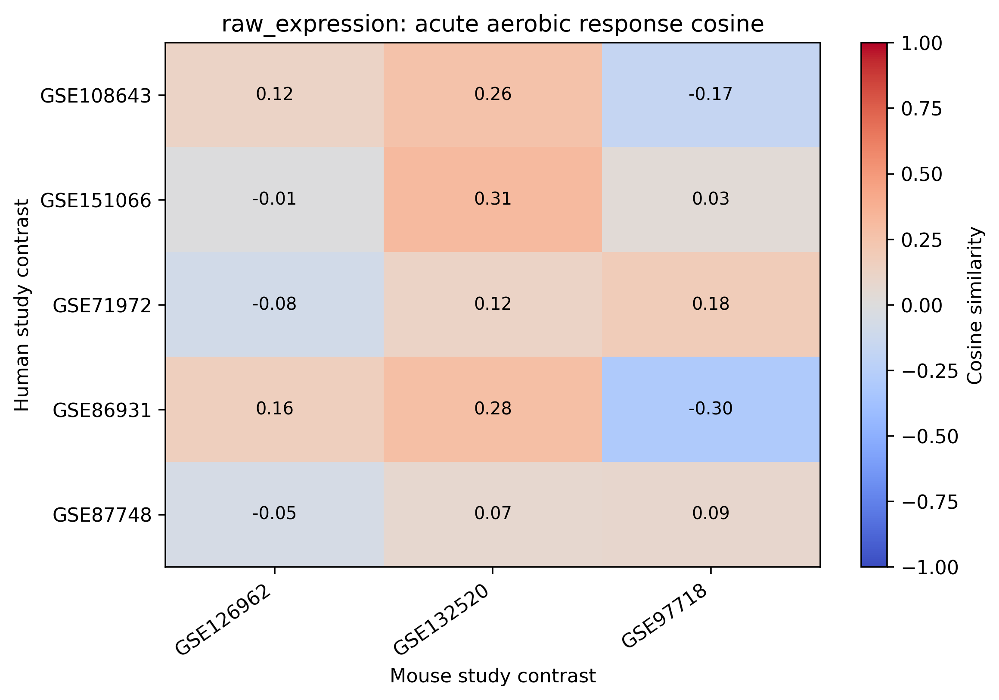

joint_pca


,GSE126962,GSE132520,GSE97718
GSE108643,0.161,0.282,-0.189
GSE151066,-0.010,0.338,0.038
GSE71972,-0.114,0.130,0.210
GSE86931,0.211,0.312,-0.343
GSE87748,-0.070,0.083,0.095


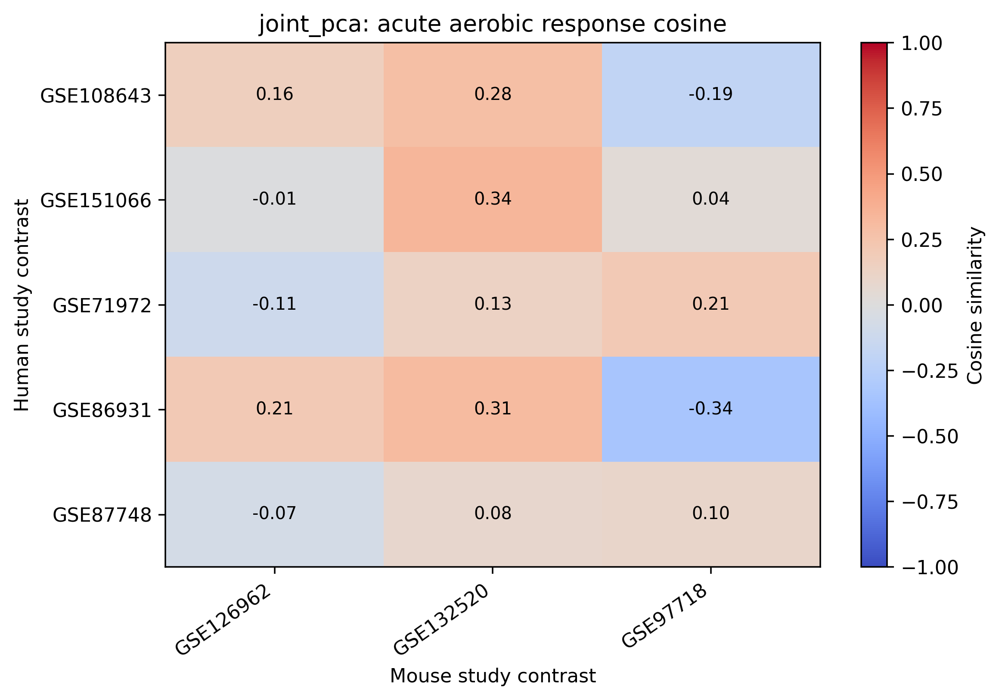

bridgerna


,GSE126962,GSE132520,GSE97718
GSE108643,0.835,0.724,-0.919
GSE151066,0.017,0.327,-0.103
GSE71972,-0.742,-0.611,0.830
GSE86931,0.792,0.778,-0.926
GSE87748,-0.722,-0.743,0.847


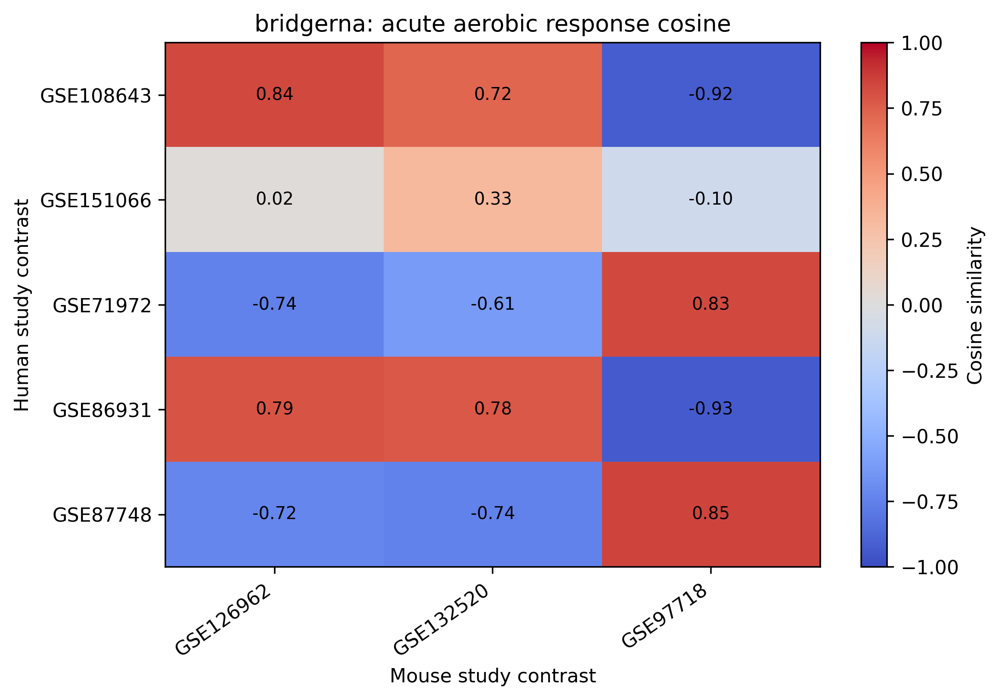

In [5]:
for representation in ['raw_expression', 'joint_pca', 'bridgerna']:
    print(representation)
    display(pd.read_csv(R / f'response_similarity_{representation}.csv', index_col=0).style.format('{:.3f}').background_gradient(cmap='coolwarm', vmin=-1, vmax=1))
    display(Image(filename=str(F / f'response_similarity_{representation}.png'), width=750))

## 5. Exploratory study rankings

In [6]:
display(rankings.style.format({'cosine_similarity':'{:.3f}'}).hide(axis='index'))
print('Top mouse response for each human study')
display(rankings.query('rank == 1')[['representation','human_GSE','mouse_GSE','cosine_similarity','human_timepoint','mouse_timepoint']]
        .style.format({'cosine_similarity':'{:.3f}'}).hide(axis='index'))

representation,human_GSE,mouse_GSE,rank,cosine_similarity,same_exercise_type,human_protocol,mouse_protocol,human_timepoint,mouse_timepoint
raw_expression,GSE108643,GSE132520,1,0.263,True,paired earliest acute post (post(0h)) minus pre/baseline,wild-type treadmill exercise minus wild-type sedentary,post(0h),wild-type; post(3h)
raw_expression,GSE108643,GSE126962,2,0.125,True,paired earliest acute post (post(0h)) minus pre/baseline,active-phase treadmill exercise minus phase/time-matched sham,post(0h),active phase; post(4h)
raw_expression,GSE108643,GSE97718,3,-0.170,True,paired earliest acute post (post(0h)) minus pre/baseline,control-diet acute treadmill post minus control-diet pre,post(0h),control diet; post(3h)
raw_expression,GSE151066,GSE132520,1,0.314,True,paired earliest acute post (post(0h)) minus pre/baseline,wild-type treadmill exercise minus wild-type sedentary,post(0h),wild-type; post(3h)
raw_expression,GSE151066,GSE97718,2,0.033,True,paired earliest acute post (post(0h)) minus pre/baseline,control-diet acute treadmill post minus control-diet pre,post(0h),control diet; post(3h)
raw_expression,GSE151066,GSE126962,3,-0.006,True,paired earliest acute post (post(0h)) minus pre/baseline,active-phase treadmill exercise minus phase/time-matched sham,post(0h),active phase; post(4h)
raw_expression,GSE71972,GSE97718,1,0.181,True,paired earliest acute post (post(0h)) minus pre/baseline,control-diet acute treadmill post minus control-diet pre,post(0h),control diet; post(3h)
raw_expression,GSE71972,GSE132520,2,0.119,True,paired earliest acute post (post(0h)) minus pre/baseline,wild-type treadmill exercise minus wild-type sedentary,post(0h),wild-type; post(3h)
raw_expression,GSE71972,GSE126962,3,-0.079,True,paired earliest acute post (post(0h)) minus pre/baseline,active-phase treadmill exercise minus phase/time-matched sham,post(0h),active phase; post(4h)
raw_expression,GSE86931,GSE132520,1,0.285,True,paired earliest acute post (post(4h)) minus pre/baseline,wild-type treadmill exercise minus wild-type sedentary,post(4h),wild-type; post(3h)


Top mouse response for each human study


representation,human_GSE,mouse_GSE,cosine_similarity,human_timepoint,mouse_timepoint
raw_expression,GSE108643,GSE132520,0.263,post(0h),wild-type; post(3h)
raw_expression,GSE151066,GSE132520,0.314,post(0h),wild-type; post(3h)
raw_expression,GSE71972,GSE97718,0.181,post(0h),control diet; post(3h)
raw_expression,GSE86931,GSE132520,0.285,post(4h),wild-type; post(3h)
raw_expression,GSE87748,GSE97718,0.085,post(4h),control diet; post(3h)
joint_pca,GSE108643,GSE132520,0.282,post(0h),wild-type; post(3h)
joint_pca,GSE151066,GSE132520,0.338,post(0h),wild-type; post(3h)
joint_pca,GSE71972,GSE97718,0.210,post(0h),control diet; post(3h)
joint_pca,GSE86931,GSE132520,0.312,post(4h),wild-type; post(3h)
joint_pca,GSE87748,GSE97718,0.095,post(4h),control diet; post(3h)


## 6. End-of-notebook summary

1. **ARCHS4 coverage is high.** Of 977 human and 359 mouse GEPREP skeletal-muscle samples, 947 human (96.9%) and 323 mouse (90.0%) have both local ARCHS4 expression rows and BridgeRNA embeddings.
2. **Usable studies exist in both species.** The broad metadata inventory identifies 29 studies with potential within-study exercise comparisons. The conservative exploratory response analysis retains five human and three mouse acute-aerobic studies.
3. **The clearest shared intervention is acute aerobic exercise.** Human protocols include cycling and unilateral knee extension; mouse protocols are primarily treadmill exercise. Acute exercise and aerobic exercise overlap as categories, but protocols and sampling times are not perfectly harmonized.
4. **Response similarity is heterogeneous.** After correcting the expression input to natural `log1p(TPM)`, Raw and PCA preserve broadly similar but not identical response geometry. Their cross-species cosine similarities are modest (Raw approximately -0.30 to 0.31; PCA approximately -0.34 to 0.34). BridgeRNA shows much stronger directional structure: four human studies have a best mouse similarity around 0.79–0.85, while GSE151066 is weaker at approximately 0.33.
5. **There is a signal worth pursuing, with important caveats.** Multiple independent human studies show strong positive response similarity to at least one mouse study across representations. However, the small number of mouse studies, heterogeneous protocols/timepoints, and absence of fully unseen matched samples mean this is hypothesis-generating rather than evidence of strict zero-shot generalization.
6. **Most sensible formal benchmark.** Acute aerobic skeletal-muscle response is the strongest candidate. A formal benchmark should prespecify matched early post-exercise windows, favor unperturbed/wild-type and control-diet strata, model human pairing explicitly, and obtain fully unseen studies before defining retrieval targets or significance tests.

**Pretraining caveat:** every matched sample is exposed at either the exact-sample or study level. Exposure is therefore retained in all tables, but this exploratory result must not be described as a held-out benchmark.

# 7. Exploratory Hallmark activity readout

This independent side experiment asks whether frozen 512-D BridgeRNA sample embeddings predict continuous per-sample activity for the 50 MSigDB Hallmark sets. It uses 40,000 human ARCHS4 samples selected round-robin across 20,643 GSEs. GSEs—not samples—define the 80/10/10 train/validation/test split. BridgeRNA remains frozen.

Targets are weighted rank-based ssGSEA scores over the canonical 15,165-gene expression matrix. The same `512 → 256 → 50` head is trained separately on BridgeRNA embeddings and a 512-component PCA baseline fitted only on training GSEs. TCGA and GTEx are external readouts and are never used to train either head.

In [7]:
from pathlib import Path
hallmark_dir = HERE / "results" / "hallmark_readout"
hallmark_summary = pd.read_csv(hallmark_dir / "summary_metrics.csv")
hallmark_metrics = pd.read_parquet(hallmark_dir / "per_hallmark_metrics.parquet")
hallmark_mapping = pd.read_csv(hallmark_dir / "hallmark_gene_mapping.csv")
hallmark_samples = pd.read_parquet(hallmark_dir / "sample_manifest.parquet")

split_summary = (hallmark_samples.groupby("readout_split")
                 .agg(samples=("gsm", "size"), GSEs=("gse", "nunique"))
                 .reindex(["train", "val", "test"]))
display(split_summary)
display(hallmark_mapping[["source_genes", "mapped_genes", "mapping_percent"]].describe().loc[["min", "50%", "mean", "max"]])

,samples,GSEs
readout_split,,
train,32029,16515
val,3976,2064
test,3995,2064


,source_genes,mapped_genes,mapping_percent
min,32.00,32.00,73.195876
50%,180.00,151.50,92.250000
mean,146.42,132.96,91.465445
max,200.00,196.00,100.000000


## 7.1 Held-out and external performance

Reported values are medians across the 50 Hallmarks. Raw result files retain full precision.

dataset,representation,hallmarks,median_pearson,median_spearman,median_mse
archs4_test,bridgerna,50,0.9726,0.9648,28382.79
archs4_test,pca,50,0.9864,0.9847,13932.63
gtex,bridgerna,50,0.9603,0.9354,37343.69
gtex,pca,50,0.9859,0.9774,20278.54
tcga,bridgerna,50,0.9361,0.9237,37168.06
tcga,pca,50,0.9685,0.9635,18759.79


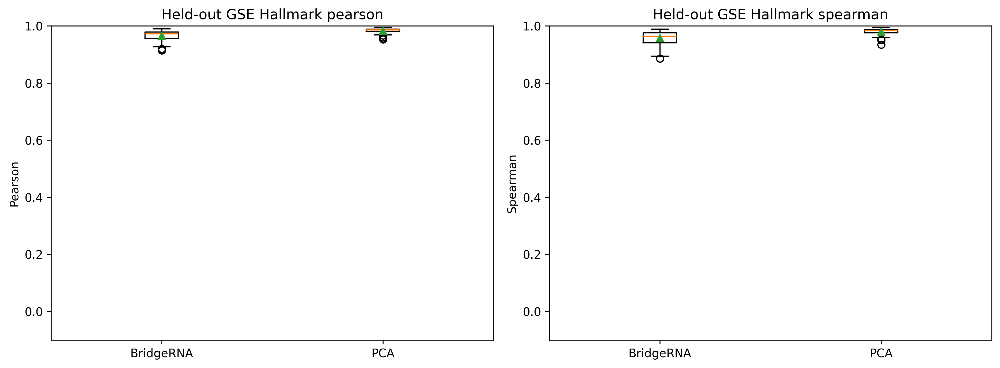

In [8]:
display(hallmark_summary.style.format({
    "median_pearson": "{:.4f}", "median_spearman": "{:.4f}", "median_mse": "{:.2f}"
}).hide(axis="index"))

display(Image(filename=str(hallmark_dir / "figures" / "heldout_performance_distribution.png"), width=950))

## 7.2 Best- and worst-performing Hallmarks

group,hallmark,pearson,spearman,mse
lowest,Cholesterol Homeostasis,0.9148,0.8862,89096.48
lowest,Wnt-beta Catenin Signaling,0.9178,0.9098,52760.15
lowest,Apical Surface,0.9198,0.9134,54376.78
lowest,Notch Signaling,0.9272,0.9220,72103.22
lowest,Interferon Alpha Response,0.9418,0.9366,221211.08
highest,Myc Targets V1,0.9881,0.9882,15206.28
highest,Allograft Rejection,0.9883,0.9718,40818.44
highest,G2-M Checkpoint,0.9887,0.9874,36555.29
highest,E2F Targets,0.9897,0.9888,41386.99
highest,Epithelial Mesenchymal Transition,0.9904,0.9892,67424.92


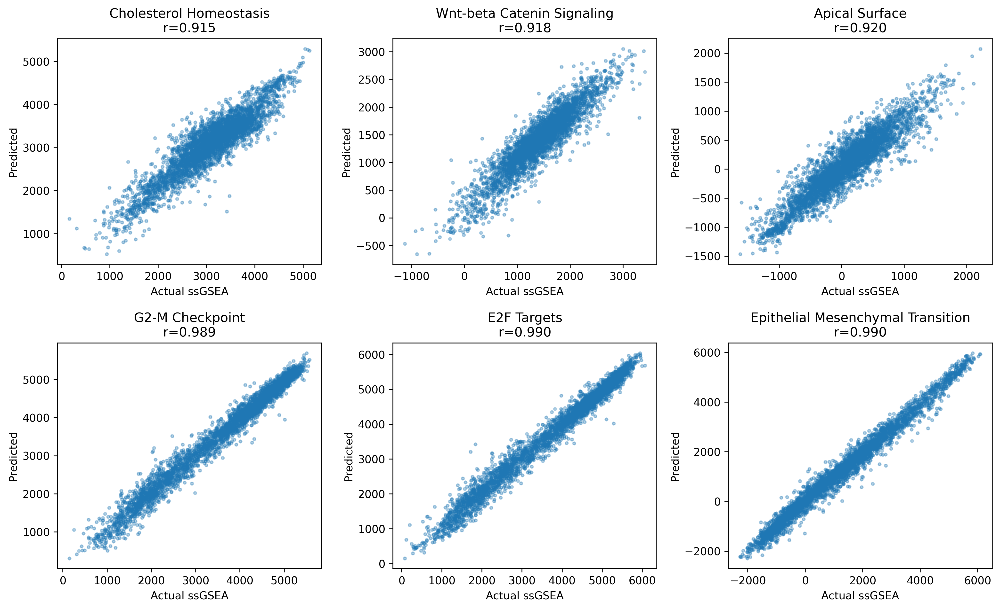

In [9]:
bridge_test = hallmark_metrics.query("dataset == 'archs4_test' and representation == 'bridgerna'").sort_values("pearson")
best_worst = pd.concat([
    bridge_test.head(5).assign(group="lowest"),
    bridge_test.tail(5).assign(group="highest")
])
display(best_worst[["group", "hallmark", "pearson", "spearman", "mse"]].style.format({
    "pearson": "{:.4f}", "spearman": "{:.4f}", "mse": "{:.2f}"
}).hide(axis="index"))
display(Image(filename=str(hallmark_dir / "figures" / "bridgerna_best_worst_scatter.png"), width=1050))

## 7.3 Exploratory interpretation

The signal is clearly present: a small head on frozen BridgeRNA embeddings predicts all 50 Hallmark ssGSEA scores strongly on entirely held-out ARCHS4 studies, and performance remains high without retraining on TCGA and GTEx. This indicates that the 512-D sample representation retains substantial pathway-level state.

PCA nevertheless performs better under this particular target. That is biologically and methodologically plausible because ssGSEA is calculated directly from expression ranks, while PCA is also a direct expression-derived representation; BridgeRNA compresses expression through a reconstruction-trained nonlinear model. The result therefore supports pathway information retention, not superiority over PCA. External performance is slightly lower than held-out ARCHS4 performance, especially for TCGA, but remains strong. This is exploratory and uses one architecture/seed without hyperparameter optimization.

# 8. Do Hallmark programs explain the opposing exercise-response axes?

The already-trained BridgeRNA Hallmark head is applied to the unchanged five human and three mouse contrasts. No model or head is retrained. Study effects are `mean(post/exercise) − mean(pre/control)` and are expressed in ARCHS4 training-target SD units. Direct ssGSEA effects use corrected `log1p(TPM)` and the identical 50 Hallmark definitions.

Uncertainty uses 1,000 bootstrap replicates. Human subjects are resampled as paired pre/post units; mouse exercise and control groups are resampled independently within role.

In [10]:
axes_dir = R / "hallmark_response_axes"
axis_geometry = pd.read_csv(axes_dir / "axis_geometry.csv")
matrix_comparison = pd.read_csv(axes_dir / "matrix_comparison.csv")
direction = pd.read_csv(axes_dir / "axis_hallmark_direction_consistency.csv")
stability = pd.read_csv(axes_dir / "axis_hallmark_bootstrap.csv")
similarity_ci = pd.read_csv(axes_dir / "cross_species_similarity_bootstrap.csv")
display(axis_geometry.style.format({c:"{:.3f}" for c in axis_geometry.columns if c != "source"}).hide(axis="index"))
display(matrix_comparison.style.format({c:"{:.3f}" for c in matrix_comparison.columns if c != "hallmark_source"}).hide(axis="index"))

source,axis_a_within_cosine,axis_b_within_cosine,between_axes_cosine
original_bridgerna,0.786,0.859,-0.783
bridgerna_predicted,0.517,-0.184,0.129
direct_ssgsea,0.400,-0.085,0.217


hallmark_source,pearson_with_bridgerna_matrix,spearman_with_bridgerna_matrix
bridgerna_predicted,0.259,0.189
direct_ssgsea,0.163,0.029


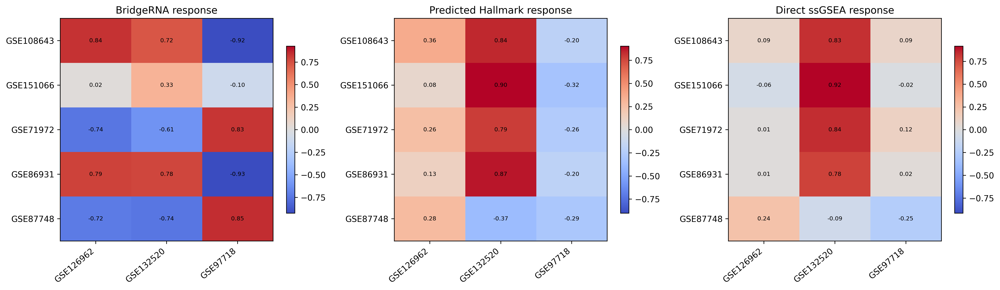

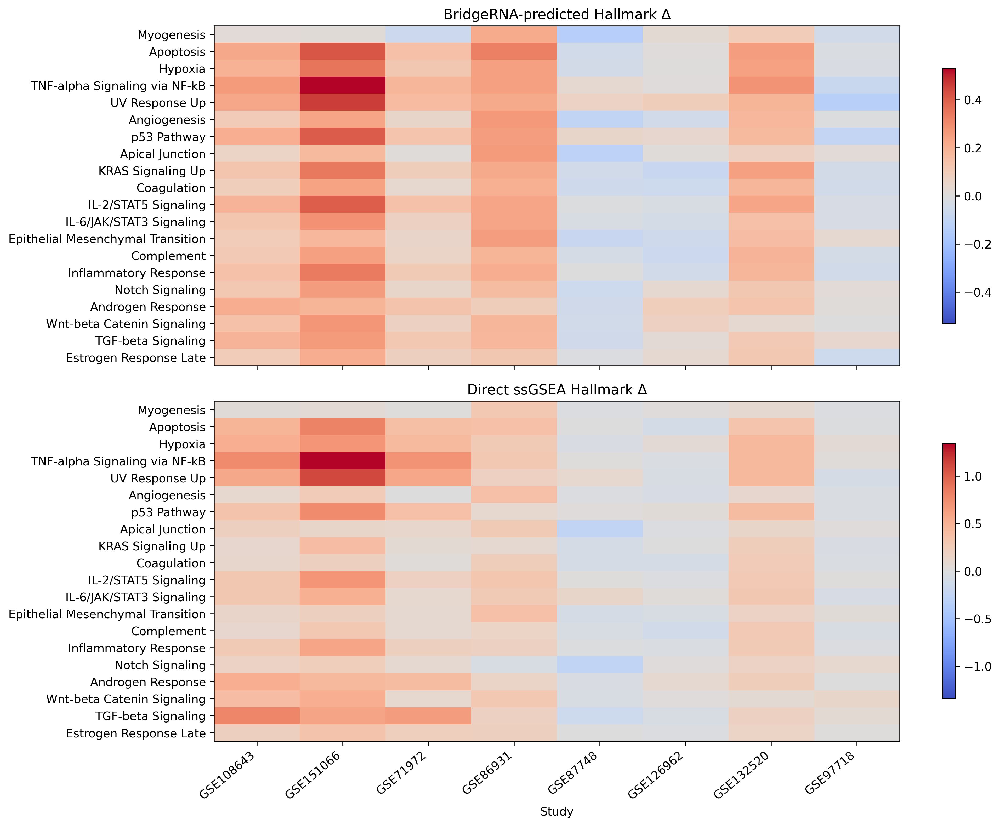

In [11]:
display(Image(filename=str(axes_dir / "figures" / "response_geometry_comparison.png"), width=1200))
display(Image(filename=str(axes_dir / "figures" / "informative_hallmark_heatmap.png"), width=1100))

## 8.1 Consistent pathway directions and uncertainty

In [12]:
consistent = direction.query("consistent_increase or consistent_decrease").copy()
consistent["direction"] = consistent.consistent_increase.map({True:"increase",False:"decrease"})
consistent = (consistent.assign(abs_delta=consistent.mean_delta.abs())
              .sort_values(["source","axis","abs_delta"],ascending=[True,True,False])
              .groupby(["source","axis"],as_index=False).head(8))
display(consistent[["source","axis","hallmark","direction","mean_delta","studies_positive","studies_negative"]]
        .style.format({"mean_delta":"{:.3f}"}).hide(axis="index"))

key_ci = similarity_ci.sort_values(["source","bootstrap_sd"],ascending=[True,False])
display(key_ci.style.format({c:"{:.3f}" for c in ["point_estimate","bootstrap_mean","bootstrap_sd","ci_low","ci_high"]}).hide(axis="index"))

source,axis,hallmark,direction,mean_delta,studies_positive,studies_negative
bridgerna_predicted,Axis A,Apoptosis,increase,0.200,4,0
bridgerna_predicted,Axis A,TNF-alpha Signaling via NF-kB,increase,0.197,4,0
bridgerna_predicted,Axis A,UV Response Up,increase,0.180,4,0
bridgerna_predicted,Axis A,Hypoxia,increase,0.173,4,0
bridgerna_predicted,Axis A,p53 Pathway,increase,0.167,4,0
bridgerna_predicted,Axis A,mTORC1 Signaling,increase,0.149,4,0
bridgerna_predicted,Axis A,Cholesterol Homeostasis,increase,0.135,4,0
bridgerna_predicted,Axis A,Unfolded Protein Response,increase,0.133,4,0
bridgerna_predicted,Axis B,Myogenesis,decrease,-0.084,0,3
bridgerna_predicted,Axis B,mTORC1 Signaling,increase,0.067,3,0


source,human_GSE,mouse_GSE,bootstrap_mean,bootstrap_sd,ci_low,ci_high,point_estimate
bridgerna_predicted,GSE87748,GSE132520,-0.193,0.407,-0.735,0.726,-0.373
bridgerna_predicted,GSE86931,GSE126962,0.145,0.394,-0.585,0.722,0.131
bridgerna_predicted,GSE87748,GSE126962,0.248,0.331,-0.387,0.820,0.276
bridgerna_predicted,GSE108643,GSE126962,0.234,0.318,-0.392,0.596,0.360
bridgerna_predicted,GSE151066,GSE97718,-0.243,0.295,-0.674,0.346,-0.320
bridgerna_predicted,GSE86931,GSE97718,-0.160,0.291,-0.605,0.449,-0.196
bridgerna_predicted,GSE151066,GSE126962,0.019,0.275,-0.491,0.395,0.084
bridgerna_predicted,GSE71972,GSE126962,0.158,0.262,-0.394,0.515,0.256
bridgerna_predicted,GSE86931,GSE132520,0.693,0.250,0.094,0.892,0.873
bridgerna_predicted,GSE108643,GSE97718,-0.146,0.241,-0.506,0.336,-0.202


## 8.2 Interpretation

1. **Hallmark biology does not fully explain the original two axes.** Original BridgeRNA effects show strong Axis-A and Axis-B coherence and strong opposition. After projecting samples through the Hallmark head, Axis A remains moderately coherent, but Axis B is internally inconsistent and the two proposed axes are no longer opposed. The predicted-Hallmark similarity matrix correlates only weakly with the original BridgeRNA matrix.
2. **Axis A has a recognizable stress/remodeling response.** Its most consistent predicted increases include apoptosis, TNF–NF-κB, UV-response-up, hypoxia, p53, mTORC1, cholesterol homeostasis, and unfolded-protein response. Many—but not all—are also supported directly by ssGSEA. Axis B has fewer consistent changes; predicted decreases include myogenesis, KRAS-signaling-down, and bile-acid metabolism, while mTORC1/cholesterol-related activity increases.
3. **Direct ssGSEA reaches the same negative conclusion about the proposed partition.** It preserves moderate Axis-A agreement but not Axis-B coherence or an opposing A/B organization. Thus the striking BridgeRNA polarity appears particularly strong in embedding displacement geometry rather than a simple 50-Hallmark pathway split.
4. **Stability is uneven.** Axis-level pathway means can have stable bootstrap signs, but many individual cross-species similarities have wide intervals crossing zero. GSE132520 produces the most reproducible positive matches; comparisons involving the smallest studies are much less certain. These results remain hypothesis-generating.

# 9. Gene-level contextual Hallmark decoding

This experiment is separate from the sample-level Hallmark readout. A shared `512 → 256 → 50` MLP is applied independently to every contextual gene token and trained against the fixed binary gene × Hallmark membership matrix. BridgeRNA remains frozen, and contextual tensors are streamed and discarded rather than cached.

The exploratory cohort contains 256 samples from 256 distinct ARCHS4 GSEs: 192 train, 32 validation, and 32 held-out test studies. BCE uses per-Hallmark positive weights. Results below calculate AUROC/AUPRC separately in every held-out context and summarize across studies; they do not first average contexts.

In [13]:
context_dir = R / "gene_context_hallmark"
context_summary = pd.read_csv(context_dir / "heldout_summary.csv")
context_metrics = pd.read_csv(context_dir / "heldout_per_hallmark_metrics.csv")
context_changes = pd.read_parquet(context_dir / "exercise_study_hallmark_changes.parquet")
context_top_genes = pd.read_csv(context_dir / "exercise_top_contextual_gene_changes.csv")
context_geometry = pd.read_csv(context_dir / "axis_geometry.csv")
context_similarity = pd.read_csv(context_dir / "cross_species_contextual_response_similarity.csv", index_col=0)
display(context_summary.style.format({c:"{:.4f}" for c in context_summary.columns if c != "test_studies"}).hide(axis="index"))
display(context_metrics.sort_values("auprc")[["hallmark","auroc","auroc_sd","auprc","auprc_sd","prevalence"]]
        .style.format({c:"{:.4f}" for c in ["auroc","auroc_sd","auprc","auprc_sd","prevalence"]}).hide(axis="index"))

test_studies,median_auroc,median_auroc_sd,median_auprc,median_auprc_sd,macro_auroc,macro_auprc
32,0.9975,0.0012,0.7950,0.0640,0.9971,0.7943


hallmark,auroc,auroc_sd,auprc,auprc_sd,prevalence
KRAS Signaling Up,0.9914,0.0040,0.5766,0.0827,0.0125
Xenobiotic Metabolism,0.9940,0.0027,0.6276,0.0901,0.0118
IL-2/STAT5 Signaling,0.9939,0.0035,0.6415,0.0734,0.0119
Apical Junction,0.9924,0.0040,0.6449,0.0965,0.0124
Complement,0.9946,0.0034,0.6530,0.0938,0.0111
UV Response Dn,0.9954,0.0026,0.6539,0.0842,0.0092
KRAS Signaling Dn,0.9933,0.0043,0.6634,0.0937,0.0116
Myogenesis,0.9938,0.0029,0.6703,0.0640,0.0125
Inflammatory Response,0.9949,0.0029,0.6751,0.0568,0.0117
Estrogen Response Early,0.9935,0.0039,0.6859,0.0892,0.0125


The high AUROC establishes that gene-set membership is readily decodable from contextual tokens. AUPRC is the more informative metric because Hallmark membership is sparse. This task alone does **not** prove context dependence: the same genes occur in training and test studies, and BridgeRNA tokens contain stable gene-identity information.

## 9.1 Exercise-dependent contextual changes

In [14]:
recurring = (context_top_genes.groupby("gene",as_index=False)
             .agg(studies=("GSE","nunique"),mean_rms_change=("rms_hallmark_score_delta","mean"))
             .sort_values(["studies","mean_rms_change"],ascending=False).head(25))
display(recurring.style.format({"mean_rms_change":"{:.4f}"}).hide(axis="index"))

axis_map={"Axis A":["GSE108643","GSE86931","GSE126962","GSE132520"],
          "Axis B":["GSE71972","GSE87748","GSE97718"]}
axis_pathways=[]
for axis,studies in axis_map.items():
    x=(context_changes[context_changes.GSE.isin(studies)].groupby("hallmark",as_index=False)
       .agg(mean_member_delta=("mean_member_score_delta","mean"),
            minimum=("mean_member_score_delta","min"),maximum=("mean_member_score_delta","max"),
            mean_fraction_increased=("fraction_member_increased","mean")))
    x["axis"]=axis; axis_pathways.append(x.sort_values("mean_member_delta",key=abs,ascending=False).head(12))
display(pd.concat(axis_pathways)[["axis","hallmark","mean_member_delta","minimum","maximum","mean_fraction_increased"]]
        .style.format({c:"{:.4f}" for c in ["mean_member_delta","minimum","maximum","mean_fraction_increased"]}).hide(axis="index"))

gene,studies,mean_rms_change
NR4A3,7,0.0942
CDKN1A,6,0.1175
SIK1,6,0.1070
ATF3,6,0.0772
ANKRD1,6,0.0646
EGR1,5,0.0999
OTUD1,5,0.0889
CX3CL1,5,0.0748
ZC3H12A,5,0.0744
APOLD1,5,0.0643


axis,hallmark,mean_member_delta,minimum,maximum,mean_fraction_increased
Axis A,PI3K/AKT/mTOR Signaling,0.0279,-0.0042,0.0728,0.7426
Axis A,Unfolded Protein Response,0.0247,0.0060,0.0576,0.8088
Axis A,mTORC1 Signaling,0.0224,0.0045,0.0558,0.7975
Axis A,Cholesterol Homeostasis,0.0161,-0.0015,0.0500,0.7036
Axis A,KRAS Signaling Dn,0.0157,0.0043,0.0350,0.7514
Axis A,Mitotic Spindle,0.0146,0.0000,0.0373,0.7334
Axis A,TGF-beta Signaling,0.0138,0.0042,0.0286,0.8800
Axis A,Notch Signaling,0.0125,0.0055,0.0295,0.7344
Axis A,Pancreas Beta Cells,0.0122,0.0008,0.0285,0.6603
Axis A,Pperoxisome,0.0115,-0.0006,0.0257,0.7686


axis,within_mean_cosine,between_axes_cosine
Axis A,0.152,0.031
Axis B,0.085,0.031


,GSE126962,GSE132520,GSE97718
GSE108643,0.055,0.099,-0.097
GSE151066,-0.004,0.132,-0.078
GSE71972,-0.021,0.034,-0.004
GSE86931,0.023,0.125,-0.126
GSE87748,0.016,-0.019,0.017


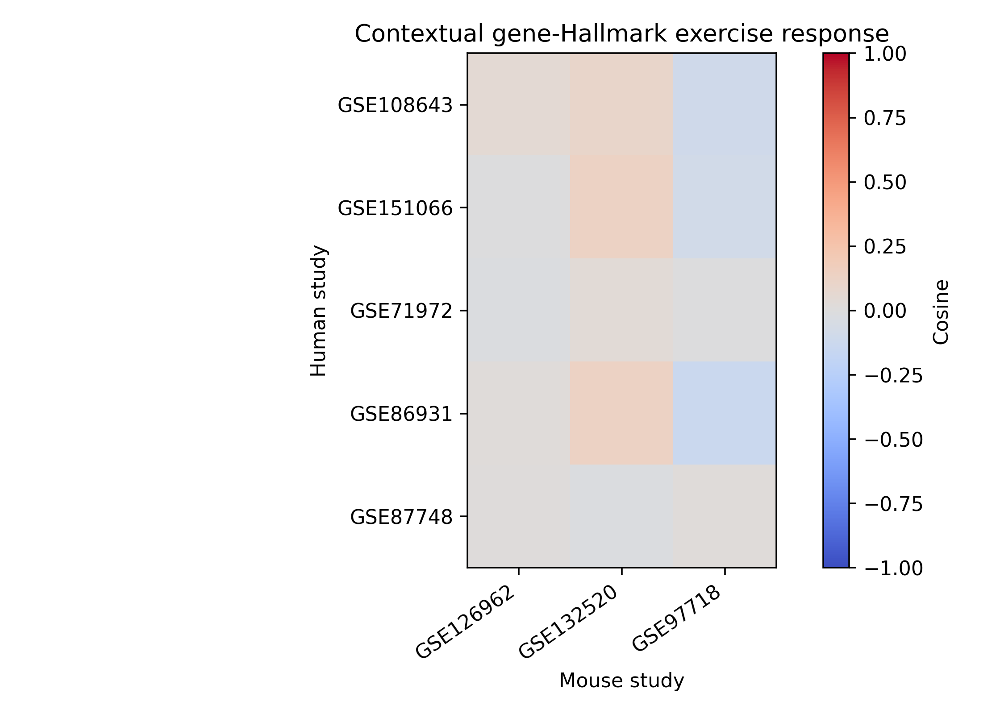

In [15]:
display(context_geometry.style.format({"within_mean_cosine":"{:.3f}","between_axes_cosine":"{:.3f}"}).hide(axis="index"))
display(context_similarity.style.format("{:.3f}").background_gradient(cmap="coolwarm",vmin=-.15,vmax=.15))
display(Image(filename=str(context_dir / "figures" / "cross_species_contextual_similarity.png"), width=750))

## 9.2 Interpretation

1. **Hallmark membership is strongly decodable.** Across 32 held-out GSE contexts, median per-Hallmark AUROC is about 0.998 and median AUPRC about 0.795. This is robust across contexts, but likely combines stable gene identity with contextual information.
2. **Contextual scores change with exercise, although most changes are small.** Recurrent high-change genes include NR4A3, CDKN1A, SIK1, ATF3, ANKRD1, EGR1, OTUD1, and other immediate-response regulators. These are candidate contextual changes, not calibrated activity probabilities.
3. **The proposed axes differ in coordinated member-gene changes.** Axis A tends toward increased PI3K/AKT/mTOR, unfolded-protein response, mTORC1, TGF-β, and related scores. Axis B tends toward decreases in mTORC1, reactive-oxygen-species, TGF-β, MYC/E2F, and several growth/remodeling programs. This provides gene-resolved clues that were unavailable from the sample-level readout.
4. **The complete contextual response geometry is not strongly conserved across species.** Flattened gene × Hallmark response similarities are small, Axis-A and Axis-B internal cosines are only 0.152 and 0.085, and their between-axis cosine is near zero. Some human contrasts weakly favor GSE132520, but this does not reproduce the strong original BridgeRNA response axes.
5. **Incremental information is primarily attribution.** The gene-level analysis identifies which genes and membership-associated outputs move, whereas the sample-level head summarizes pathway state more coherently. It does not yet demonstrate that contextual token changes add a stable conserved exercise signal beyond the sample embedding.

# 10. Direct attribution of latent exercise axes to genes

This analysis bypasses both Hallmark heads. Axis directions are constructed from the original frozen 512-D BridgeRNA response vectors as the normalized mean of normalized study effects. The scalar attribution target is the dot product between a sample embedding and the corresponding unit axis direction.

Integrated Gradients uses an all-zero `log1p(TPM)` profile as its absence-of-expression baseline and eight midpoint integration steps. IG is calculated for each study's mean post and mean pre/control profile, followed by post-minus-pre attribution. GSE151066 remains excluded from both axis consensuses; for descriptive attribution only, its closer fixed direction is used. The deletion test masks genes with BridgeRNA's native `−10` mask token and compares Top 25/50/100 with three deterministic random panels of equal size.

Median IG completeness error: 0.0810%; maximum: 0.1625%


axis,rank,gene,mean_attribution_change,absolute_mean_attribution_change,prior_context_gene
Axis A,1,FBXO32,0.01214,0.01214,False
Axis A,2,NMRK2,-0.00887,0.00887,False
Axis A,3,MYL1,-0.00884,0.00884,False
Axis A,4,ASB5,0.00814,0.00814,False
Axis A,5,MT-ND6,0.00774,0.00774,False
Axis A,6,ENAH,0.00650,0.00650,False
Axis A,7,FNBP1L,0.00648,0.00648,False
Axis A,8,ACTC1,-0.00598,0.00598,False
Axis A,9,PVALB,0.00565,0.00565,False
Axis A,10,SFXN4,0.00537,0.00537,False


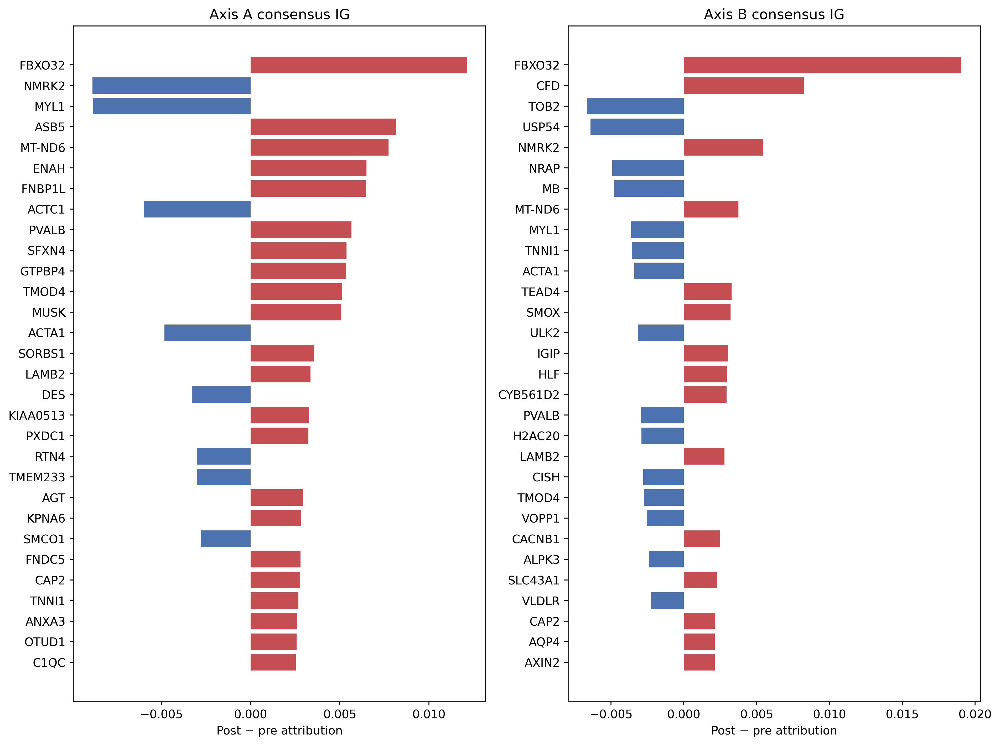

In [16]:
ig_dir = R / "latent_axis_attribution"
ig_consensus = pd.read_csv(ig_dir / "axis_consensus_attributed_genes.csv")
ig_de = pd.read_csv(ig_dir / "attribution_vs_de_summary.csv")
ig_stability = pd.read_csv(ig_dir / "within_axis_ranking_stability.csv")
ig_deletion = pd.read_csv(ig_dir / "deletion_test_summary.csv")
ig_complete = pd.read_csv(ig_dir / "integrated_gradients_completeness.csv")

relative_error = ig_complete.completeness_delta.abs() / ig_complete.score_difference.abs()
print(f"Median IG completeness error: {relative_error.median():.4%}; maximum: {relative_error.max():.4%}")
display(ig_consensus.query("rank <= 30").style.format({
    "mean_attribution_change":"{:.5f}","absolute_mean_attribution_change":"{:.5f}"
}).hide(axis="index"))
display(Image(filename=str(ig_dir / "figures" / "axis_consensus_top_genes.png"), width=1000))

## 10.1 Conservation, differential expression, and prior contextual genes

In [17]:
display(ig_de.style.format({
    "absolute_attribution_vs_absolute_de_spearman":"{:.3f}","top100_jaccard":"{:.3f}"
}).hide(axis="index"))

species = {"GSE108643":"human","GSE86931":"human","GSE126962":"mouse","GSE132520":"mouse",
           "GSE71972":"human","GSE87748":"human","GSE97718":"mouse"}
stability = ig_stability.copy()
stability["comparison"] = stability.apply(
    lambda r: "cross-species" if species[r.GSE_1] != species[r.GSE_2] else "within-species", axis=1)
display(stability.groupby(["axis","comparison"],as_index=False).agg(
    mean_top100_overlap=("top100_overlap","mean"),
    mean_rank_spearman=("absolute_rank_spearman","mean")
).style.format({"mean_top100_overlap":"{:.1f}","mean_rank_spearman":"{:.3f}"}).hide(axis="index"))

prior = {"NR4A3","CDKN1A","SIK1","ATF3","ANKRD1","EGR1","OTUD1","CX3CL1"}
display(ig_consensus[ig_consensus.gene.isin(prior)].sort_values(["axis","rank"]).style.hide(axis="index"))

GSE,species,axis,absolute_attribution_vs_absolute_de_spearman,top100_overlap,top100_jaccard,prior_context_genes_in_top100
GSE108643,human,Axis A,0.664,19,0.105,3
GSE151066,human,Axis A,0.689,44,0.282,5
GSE71972,human,Axis B,0.721,13,0.070,3
GSE86931,human,Axis A,0.671,11,0.058,1
GSE87748,human,Axis B,0.687,11,0.058,4
GSE126962,mouse,Axis A,0.621,10,0.053,0
GSE132520,mouse,Axis A,0.618,17,0.093,4
GSE97718,mouse,Axis B,0.673,10,0.053,0


axis,comparison,mean_top100_overlap,mean_rank_spearman
Axis A,cross-species,27.8,0.500
Axis A,within-species,40.5,0.646
Axis B,cross-species,26.5,0.452
Axis B,within-species,36.0,0.614


axis,rank,gene,mean_attribution_change,absolute_mean_attribution_change,prior_context_gene
Axis A,29,OTUD1,0.002576,0.002576,True
Axis A,46,ANKRD1,0.002102,0.002102,True
Axis A,50,NR4A3,0.002062,0.002062,True
Axis A,186,CDKN1A,0.000930,0.000930,True
Axis A,221,CX3CL1,0.000847,0.000847,True
Axis B,32,OTUD1,0.001986,0.001986,True
Axis B,46,ATF3,0.001562,0.001562,True
Axis B,74,NR4A3,-0.001237,0.001237,True
Axis B,91,ANKRD1,-0.001044,0.001044,True
Axis B,97,CX3CL1,-0.000995,0.000995,True


## 10.2 Native-mask deletion validation

axis,genes_masked,random,top,top_vs_random_fold
Axis A,25,0.000874,0.015041,17.2×
Axis A,50,0.001044,0.024963,23.9×
Axis A,100,0.002706,0.037820,14.0×
Axis B,25,0.000558,0.003884,7.0×
Axis B,50,0.000448,0.015317,34.2×
Axis B,100,0.000988,0.020372,20.6×


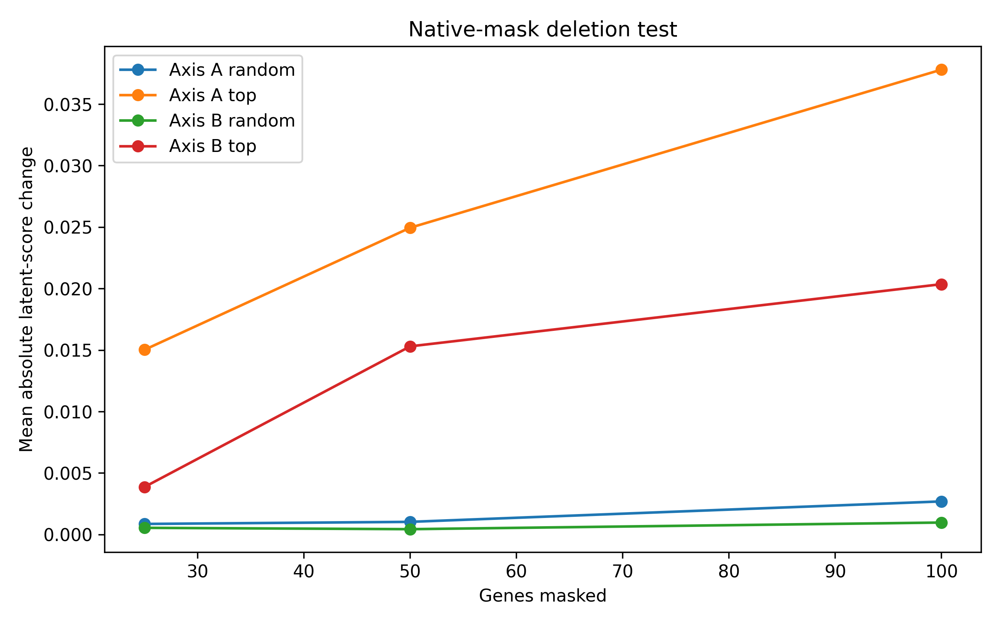

In [18]:
deletion = ig_deletion.pivot(index=["axis","genes_masked"],columns="panel_type",values="mean_absolute_change").reset_index()
deletion["top_vs_random_fold"] = deletion["top"] / deletion["random"]
display(deletion.style.format({"random":"{:.6f}","top":"{:.6f}","top_vs_random_fold":"{:.1f}×"}).hide(axis="index"))
display(Image(filename=str(ig_dir / "figures" / "deletion_test.png"), width=750))

## 10.3 Interpretation

1. **Genes driving the directions.** Axis A is led by FBXO32, NMRK2, MYL1, ASB5, MT-ND6, ENAH, FNBP1L, ACTC1, PVALB, TMOD4, MUSK, ACTA1, SORBS1, and FNDC5. Axis B is also led by FBXO32 but emphasizes CFD, TOB2, USP54, NMRK2, NRAP, MB, MYL1, TNNI1, ACTA1, TEAD4, SMOX, ULK2, and CISH. These lists mix muscle structural/metabolic genes with regulatory and stress-response genes; no pathway label is imposed here.
2. **Conservation is moderate, not exact.** Cross-species absolute-attribution rank correlations average about 0.50 for Axis A and 0.45 for Axis B, with about 28 and 27 shared Top-100 genes. Within-species agreement is stronger. Axis A and B themselves share 41 Top-100 genes, showing a common muscle-response component alongside axis-specific ordering.
3. **Attribution and ordinary differential expression overlap only partly.** Genome-wide absolute-effect Spearman correlations are moderate (median approximately 0.67), but the median Top-100 overlap is only 12 genes. IG is therefore related to expression magnitude while prioritizing a distinct subset that most affects the nonlinear latent projection.
4. **Previous contextual genes recur selectively.** Each study contains a median of three of the eight prior candidates in its attribution Top 100. Axis consensus includes OTUD1, ANKRD1, NR4A3, CDKN1A, CX3CL1, and—for Axis B—ATF3 within the saved Top 500. SIK1 and EGR1 are not consensus leaders.
5. **Deletion supports specificity.** Masking attributed genes alters the axis score roughly 7–34 times more than size-matched random panels. Top-100 masking leaves about 91.8% of Axis-A and 94.3% of Axis-B signal, versus approximately 99.8–99.9% after random masking. Thus the ranking is causally enriched for influential inputs, although the latent response is distributed rather than controlled by a handful of genes.

The eight-step midpoint IG approximation is numerically adequate here: median completeness error is below 0.1% and the maximum is below 0.2%. Random deletion uses only three panels and should be treated as an exploratory control, not a formal null distribution.

## 10. Full-transcriptome differential expression versus latent attribution

This final exercise analysis returns to the original ARCHS4 v2.5 integer gene-count matrices **before** the 15,165-gene restriction. It uses the exact saved samples, roles, directions, and strata. Human contrasts use paired subject + condition edgeR designs when complete pairing is available; mouse contrasts use condition designs. edgeR applies `filterByExpr`, TMM normalization, and quasi-likelihood testing. Counts were not reconstructed from TPM.

The comparison asks whether latent-axis Integrated Gradients (IG) merely follows large marginal expression changes. Contextual change is the RMS change across the 50 contextual Hallmark-head outputs for each gene. Small-N contrasts, especially 2-vs-2 studies, should be interpreted cautiously.

In [19]:
from pathlib import Path
import json, numpy as np, pandas as pd
from IPython.display import Image, display
D = R / "full_transcriptome_de"
coverage_de = pd.read_csv(D / "vocabulary_coverage_summary.csv")
ranking_de = pd.read_csv(D / "ranking_comparisons.csv")
genes_de = pd.read_parquet(D / "within_vocabulary_gene_comparisons.parquet")
outside_de = pd.read_parquet(D / "top_outside_vocabulary_genes.parquet")
conserved_ig = pd.read_csv(D / "conserved_high_ig_genes.csv")
verified = json.loads((D / "verified_prior_results.json").read_text())
human_n = coverage_de.loc[coverage_de.species.eq('human'), 'samples'].sum()
mouse_n = coverage_de.loc[coverage_de.species.eq('mouse'), 'samples'].sum()
print(f'Samples: {coverage_de.samples.sum()} ({human_n} human; {mouse_n} mouse)')
display(coverage_de.style.format({c:'{:.1%}' for c in coverage_de.columns if c.endswith('_pct')}).hide(axis='index'))

Samples: 146 (126 human; 20 mouse)


contrast_id,GSE,species,samples,genes_available,genes_tested,inside_vocabulary,inside_pct,outside_vocabulary,outside_pct,top50_outside,top50_outside_pct,top100_outside,top100_outside_pct,top500_outside,top500_outside_pct
human_GSE108643,GSE108643,human,56,67186,13374,9989,74.7%,3385,25.3%,19,38.0%,36,36.0%,183,36.6%
human_GSE151066,GSE151066,human,38,67186,23962,12969,54.1%,10993,45.9%,23,46.0%,54,54.0%,300,60.0%
human_GSE71972,GSE71972,human,12,67186,19762,12026,60.9%,7736,39.1%,27,54.0%,62,62.0%,311,62.2%
human_GSE86931,GSE86931,human,4,67186,17273,11652,67.5%,5621,32.5%,35,70.0%,68,68.0%,279,55.8%
human_GSE87748,GSE87748,human,16,67186,18261,11650,63.8%,6611,36.2%,38,76.0%,76,76.0%,344,68.8%
mouse_GSE126962,GSE126962,mouse,4,53511,15911,11737,73.8%,4174,26.2%,43,86.0%,87,87.0%,387,77.4%
mouse_GSE132520,GSE132520,mouse,8,53511,14301,11251,78.7%,3050,21.3%,14,28.0%,37,37.0%,190,38.0%
mouse_GSE97718,GSE97718,mouse,8,53511,12543,10437,83.2%,2106,16.8%,24,48.0%,45,45.0%,191,38.2%


### Vocabulary coverage among the strongest ordinary DE responses

“Outside” means the original annotated gene cannot be mapped to the exact BridgeRNA one-to-one ortholog vocabulary. The full tables retain Ensembl ID, source symbol, biotype, log2 fold change, p-value, FDR, and rank. Large effects without small FDR in tiny studies are descriptive rather than definitive.

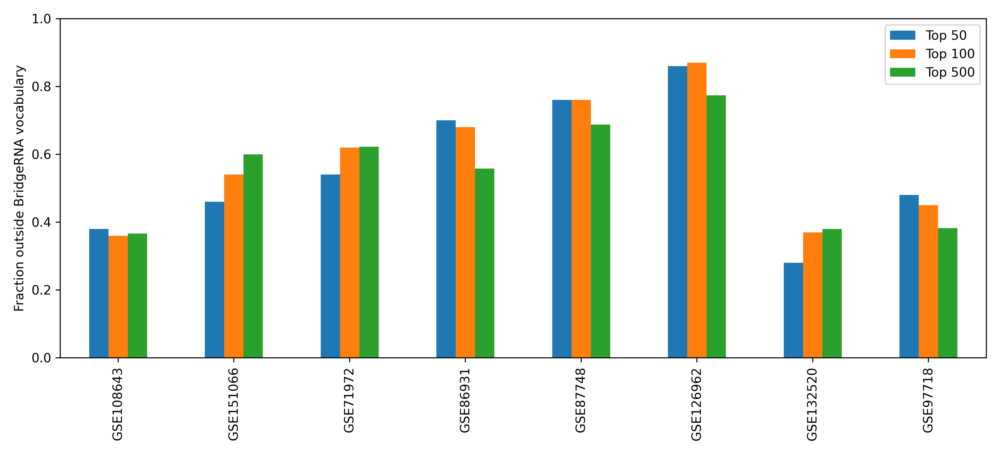

GSE,gene_id,gene_symbol,biotype,log2_fold_change,adjusted_p_value,absolute_effect_rank
GSE108643,ENSG00000287403,ENSG00000287403,lncRNA,6.026,0.000105,2
GSE108643,ENSG00000278330,ENSG00000278330,lncRNA,4.808,9.96e-16,3
GSE108643,ENSG00000223834,ENSG00000223834,lncRNA,3.489,4.42e-12,7
GSE108643,ENSG00000288673,ENSG00000288673,protein_coding,3.327,0.000109,9
GSE108643,ENSG00000271086,NAMA,lncRNA,3.321,1.62e-08,10
GSE108643,ENSG00000290095,ENSG00000290095,lncRNA,3.312,8.9e-08,11
GSE108643,ENSG00000286694,ENSG00000286694,lncRNA,3.279,8.08e-11,12
GSE108643,ENSG00000278299,TBC1D3C,protein_coding,-3.234,0.0269,13
GSE126962,ENSMUSG00000084983,Gm11789,lncRNA,-10.009,0.681,1
GSE126962,ENSMUSG00000078881,Gm14434,protein_coding,9.884,1,2


In [20]:
display(Image(filename=str(D / "figures/top_de_vocabulary_coverage.png")))
cols=['GSE','gene_id','gene_symbol','biotype','log2_fold_change','adjusted_p_value','absolute_effect_rank']
notable=(outside_de.sort_values(['GSE','absolute_effect_rank']).groupby('GSE',group_keys=False).head(8)[cols])
display(notable.style.format({'log2_fold_change':'{:.3f}','adjusted_p_value':'{:.3g}','absolute_effect_rank':'{:.0f}'}).hide(axis='index'))

### DE, IG, and contextual ranking agreement

Correlations and overlaps are calculated only for genes both tested by edgeR and present in the 15,165-gene model vocabulary. This differs from the earlier comparison based on canonical log1p(TPM) mean effects; the saved earlier values are loaded and verified below rather than hard-coded.

contrast_id,GSE,species,comparison,genes_compared,spearman,top50_overlap,top100_overlap,top500_overlap
human_GSE108643,GSE108643,human,DE_vs_IG,9989,0.285,4,13,141
human_GSE108643,GSE108643,human,DE_vs_contextual,9989,0.356,28,65,329
human_GSE108643,GSE108643,human,IG_vs_contextual,9989,0.233,5,14,129
human_GSE151066,GSE151066,human,DE_vs_IG,12969,0.185,14,30,131
human_GSE151066,GSE151066,human,DE_vs_contextual,12969,0.265,33,66,289
human_GSE151066,GSE151066,human,IG_vs_contextual,12969,0.141,14,34,130
human_GSE71972,GSE71972,human,DE_vs_IG,12026,0.139,4,10,70
human_GSE71972,GSE71972,human,DE_vs_contextual,12026,0.340,36,64,272
human_GSE71972,GSE71972,human,IG_vs_contextual,12026,0.193,4,13,72
human_GSE86931,GSE86931,human,DE_vs_IG,11652,0.113,3,6,81


Median edgeR |DE|–IG Spearman: 0.265
Median edgeR DE/IG Top-100 overlap: 9.5
Previously saved canonical-profile values: {'prior_median_de_ig_spearman': 0.6718114585367291, 'prior_median_top100_overlap': 12.0, 'Axis A_cross_species_mean_rank_spearman': 0.5004365734100609, 'Axis A_cross_species_mean_top100_overlap': 27.75, 'Axis B_cross_species_mean_rank_spearman': 0.451932666999927, 'Axis B_cross_species_mean_top100_overlap': 26.5}


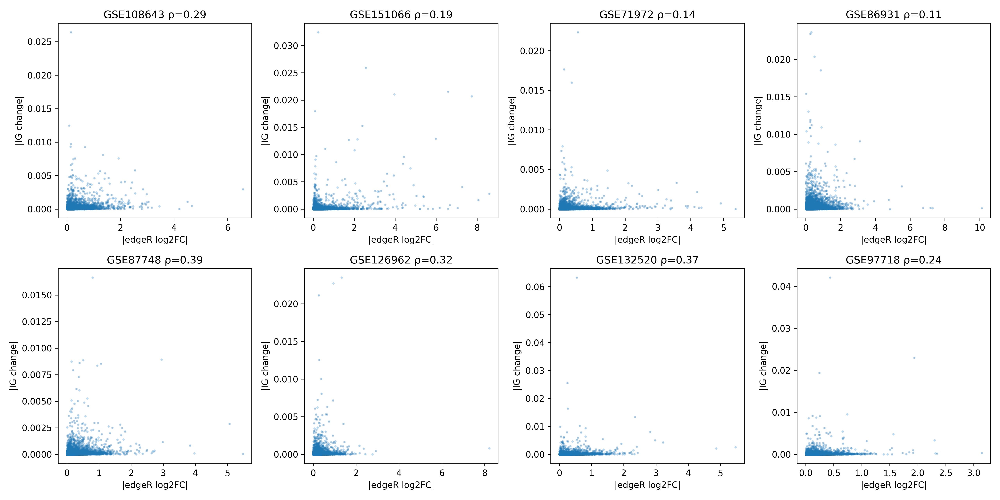

In [21]:
display(ranking_de.style.format({'spearman':'{:.3f}'}).hide(axis='index'))
print('Median edgeR |DE|–IG Spearman:', f"{ranking_de.loc[ranking_de.comparison.eq('DE_vs_IG'), 'spearman'].median():.3f}")
print('Median edgeR DE/IG Top-100 overlap:', f"{ranking_de.loc[ranking_de.comparison.eq('DE_vs_IG'), 'top100_overlap'].median():.1f}")
print('Previously saved canonical-profile values:', verified)
display(Image(filename=str(D / "figures/de_vs_ig.png")))

### Gene categories and conserved attribution

Definitions are deliberately simple and fixed: high = Top 100; “modest DE + high IG” = IG Top 100 but DE below Top 500; high contextual + high IG = both Top 100. Conserved high-IG genes are intersections of human- and mouse-consensus Top-100 rankings within each predefined axis.

In [22]:
category_counts=(genes_de.assign(category=genes_de.categories.str.split(';')).explode('category').query("category != ''").groupby(['GSE','category']).size().rename('genes').reset_index())
display(category_counts.pivot(index='GSE',columns='category',values='genes').fillna(0).astype(int))
print('Conserved high-IG genes by axis')
display(conserved_ig.style.format({'human_mean_ig_rank':'{:.1f}', 'mouse_mean_ig_rank':'{:.1f}'}).hide(axis='index'))

category,high_context_high_ig,high_de_high_ig,modest_de_high_ig
GSE,,,
GSE108643,14,12,64
GSE126962,5,3,85
GSE132520,12,13,71
GSE151066,34,30,48
GSE71972,13,10,76
GSE86931,5,6,82
GSE87748,8,9,78
GSE97718,5,7,80


Conserved high-IG genes by axis


axis,gene,human_mean_ig_rank,mouse_mean_ig_rank
Axis A,ACTA1,56.0,49.0
Axis A,ACTC1,104.0,5.0
Axis A,ANXA3,63.0,137.0
Axis A,ASB5,7.5,32.5
Axis A,ATF1,114.0,34.5
Axis A,ATP1A2,111.0,155.5
Axis A,ATPAF1,138.5,119.0
Axis A,CACNB1,75.5,58.0
Axis A,ENAH,31.0,19.5
Axis A,FBXO32,28.0,32.0


### Interpretation

The count-based analysis shows that IG is related to—but far from reducible to—ordinary DE magnitude. Across studies, edgeR |log2FC|–IG rank correlations are modest, while only a small minority of Top-100 genes overlap. Many IG Top-100 genes fall below the DE Top 500, supporting substantial coordinated/context-dependent ranking structure beyond the largest marginal changes. The contextual score generally follows DE more closely than IG does.

A material fraction of tested genes, and often an even larger fraction of the strongest apparent DE genes, lies outside BridgeRNA's vocabulary. These include interpretable protein-coding responses as well as lncRNAs, pseudogenes, and incompletely named loci; extreme effects in small-N studies often have weak FDR support. BridgeRNA therefore cannot directly attribute those genes, although their downstream state may be indirectly reflected through observed ortholog genes.

The result refines rather than overturns the latent-axis interpretation: the axes partly encode ordinary exercise-responsive expression, but their gene priorities also contain considerable additional multivariate structure. This remains an attribution analysis of a frozen predictor—not proof that highlighted genes are causal regulators.

## 11. GO/KEGG/Reactome enrichment of latent-axis IG genes

Enrichment is performed on four frozen, pre-existing IG-derived sets: Axis A Top-100, Axis B Top-100, and the conserved human–mouse Top-100 intersections for each axis. The conserved sets contain 25 Axis A and 31 Axis B genes. All tests use the exact **15,165 model genes as a custom background** with g:Profiler g:SCS multiple-testing correction. No genes were reranked after enrichment.

In [23]:
E = R / 'latent_axis_attribution' / 'enrichment'
ig_enrichment = pd.read_parquet(E / 'ig_pathway_enrichment.parquet')
ig_enrichment_summary = pd.read_csv(E / 'ig_pathway_enrichment_summary.csv')
axis_biology = pd.read_csv(E / 'axis_biology_comparison.csv')
display(ig_enrichment_summary.style.hide(axis='index'))
display(axis_biology.style.format({c:'{:.3f}' for c in axis_biology.columns if 'jaccard' in c}).hide(axis='index'))

gene_set,source,query_genes,background_genes,tested_terms,significant_terms
axis_a_top100,GO:BP,100,15165,24546,1
axis_a_top100,KEGG,100,15165,586,3
axis_a_top100,REAC,100,15165,2849,2
axis_b_top100,GO:BP,100,15165,24546,2
axis_b_top100,KEGG,100,15165,586,4
axis_b_top100,REAC,100,15165,2849,2
axis_a_conserved_human_mouse,GO:BP,25,15165,24546,0
axis_a_conserved_human_mouse,KEGG,25,15165,586,2
axis_a_conserved_human_mouse,REAC,25,15165,2849,2
axis_b_conserved_human_mouse,GO:BP,31,15165,24546,0


scope,axis_a_genes,axis_b_genes,shared_genes,gene_jaccard,GO:BP_axis_a_terms,GO:BP_axis_b_terms,GO:BP_shared_terms,GO:BP_term_jaccard,KEGG_axis_a_terms,KEGG_axis_b_terms,KEGG_shared_terms,KEGG_term_jaccard,REAC_axis_a_terms,REAC_axis_b_terms,REAC_shared_terms,REAC_term_jaccard
top100,100,100,41,0.258,1,2,0,0.000,3,4,3,0.750,2,2,2,1.000
conserved,25,31,10,0.217,0,0,0,nan,2,1,1,0.500,2,1,1,0.500


### Significant biology

The table reports every significant result returned for the requested sources, followed by the compact visualization. Because the conserved sets are small, absence of significant GO terms should not be interpreted as absence of biological coherence.

query,source,native,name,p_value,intersection_size,query_size
axis_a_conserved_human_mouse,KEGG,KEGG:04260,Cardiac muscle contraction,0.000546,4,25
axis_a_conserved_human_mouse,KEGG,KEGG:04820,Cytoskeleton in muscle cells,0.00171,5,25
axis_a_conserved_human_mouse,REAC,REAC:R-HSA-397014,Muscle contraction,0.000183,6,25
axis_a_conserved_human_mouse,REAC,REAC:R-HSA-390522,Striated Muscle Contraction,0.00919,3,25
axis_a_top100,GO:BP,GO:0003012,muscle system process,0.0193,14,100
axis_a_top100,KEGG,KEGG:04820,Cytoskeleton in muscle cells,1.72e-07,13,100
axis_a_top100,KEGG,KEGG:05410,Hypertrophic cardiomyopathy,0.00371,6,100
axis_a_top100,KEGG,KEGG:05414,Dilated cardiomyopathy,0.00465,6,100
axis_a_top100,REAC,REAC:R-HSA-390522,Striated Muscle Contraction,2.77e-08,8,100
axis_a_top100,REAC,REAC:R-HSA-397014,Muscle contraction,2.09e-05,11,100


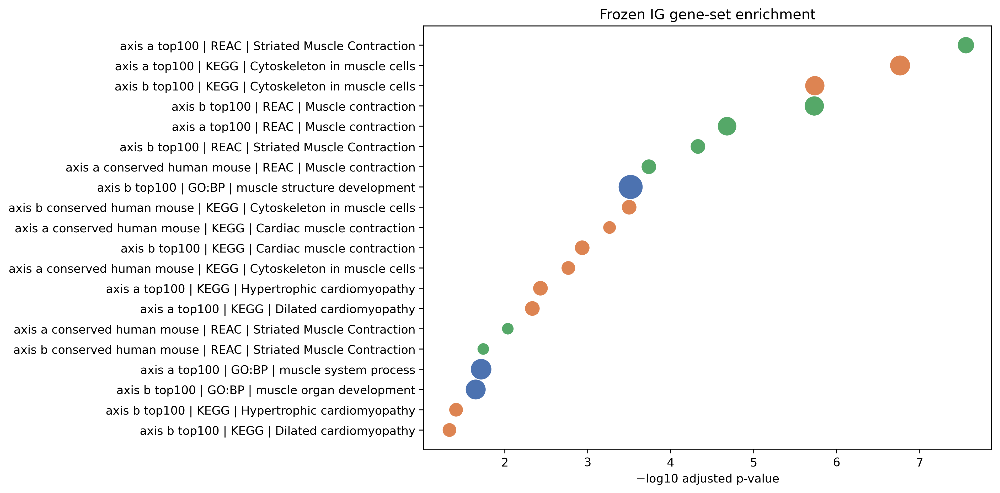

In [24]:
display(ig_enrichment[['query','source','native','name','p_value','intersection_size','query_size']].style.format({'p_value':'{:.3g}'}).hide(axis='index'))
display(Image(filename=str(E / 'ig_pathway_enrichment_top_terms.png')))

### Axis A versus Axis B interpretation

Both IG axes are coherent with skeletal/striated-muscle biology. Their Top-100 gene sets overlap by 41 genes (Jaccard 0.258), and all significant Reactome terms are shared. Three of Axis A's three significant KEGG terms are also enriched for Axis B; Axis B additionally contains cardiac-muscle contraction. Axis A is enriched for *muscle system process*, whereas Axis B is enriched for *muscle structure development* and *muscle organ development*.

The conserved human–mouse sets reinforce the same conclusion: both retain cytoskeleton/striated-muscle enrichment, and their gene overlap is 10 genes (Jaccard 0.217). Axis A's conserved set additionally reaches significance for cardiac-muscle contraction and the broader Reactome muscle-contraction term. Thus, the conserved IG genes are biologically coherent, but this analysis provides limited evidence that A and B represent wholly distinct pathway programs. The strongest defensible interpretation is a shared muscle-response backbone with differences in gene composition and emphasis, rather than two cleanly separated biological pathways.

## 12. Conventional DE biology versus BridgeRNA IG biology

This comparison uses completed edgeR and frozen IG outputs without new inference. Axis-specific DE consensus ranks are mean within-study absolute-effect rank percentiles; genes not tested in a study receive the worst percentile. Four sets are tested per axis: DE Top-100, IG Top-100, their intersection, and IG Top-100 genes outside the DE Top-500. Enrichment uses GO Biological Process, KEGG, and Reactome with g:SCS correction and the exact **15,165-gene custom background**.

In [25]:
C = R / 'latent_axis_attribution' / 'de_ig_enrichment'
de_ig_summary = pd.read_csv(C / 'de_ig_enrichment_summary.csv')
de_ig_pathways = pd.read_parquet(C / 'de_ig_enrichment.parquet')
de_ig_sets = pd.read_csv(C / 'de_ig_gene_sets.csv')
program_audit = pd.read_csv(C / 'stress_inflammatory_metabolic_term_audit.csv')
print('Gene-set sizes')
display(de_ig_sets.groupby(['axis','gene_set']).size().rename('genes').reset_index().style.hide(axis='index'))
print('Significant corrected pathways')
display(de_ig_summary.pivot_table(index=['axis','gene_set','query_genes'],columns='source',values='significant_terms').fillna(0).astype(int))

Gene-set sizes


axis,gene_set,genes
Axis A,de_top100,100
Axis A,high_ig_low_de,79
Axis A,ig_top100,100
Axis A,shared,9
Axis B,de_top100,100
Axis B,high_ig_low_de,85
Axis B,ig_top100,100
Axis B,shared,8


Significant corrected pathways


source                             GO:BP  KEGG  REAC
axis   gene_set       query_genes                   
Axis A de_top100      100             40     5     3
       high_ig_low_de 79               1     3     2
       ig_top100      100              1     3     2
       shared         9                0     1     0
Axis B de_top100      100             14     1     0
       high_ig_low_de 85               0     4     2
       ig_top100      100              2     4     2
       shared         8                0     0     0

### Axis A comparison

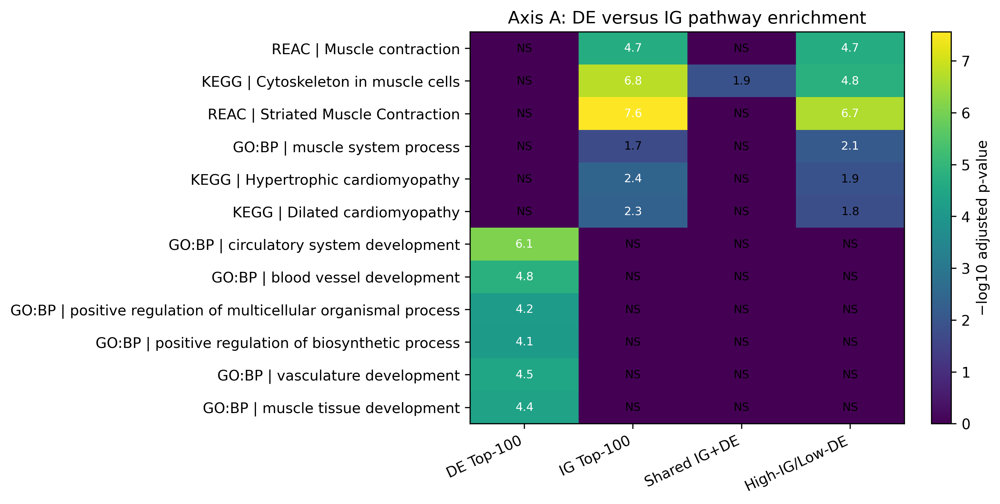

query,source,name,p_value,intersection_size
axis_a__de_top100,GO:BP,circulatory system development,8.12e-07,29
axis_a__de_top100,GO:BP,blood vessel development,1.57e-05,22
axis_a__de_top100,GO:BP,vasculature development,3.41e-05,22
axis_a__de_top100,GO:BP,muscle tissue development,4.34e-05,17
axis_a__de_top100,GO:BP,positive regulation of multicellular organismal process,6.57e-05,31
axis_a__de_top100,KEGG,MicroRNAs in cancer,0.00547,7
axis_a__de_top100,KEGG,Osteoclast differentiation,0.00668,6
axis_a__de_top100,KEGG,KEGG root term,0.0221,62
axis_a__de_top100,KEGG,HIF-1 signaling pathway,0.0369,5
axis_a__de_top100,KEGG,MAPK signaling pathway,0.0468,8


In [26]:
display(Image(filename=str(C / 'axis_a_de_ig_enrichment.png')))
a_top=de_ig_pathways[de_ig_pathways['query'].str.startswith('axis_a')].groupby(['query','source'],group_keys=False).head(5)
display(a_top[['query','source','name','p_value','intersection_size']].style.format({'p_value':'{:.3g}'}).hide(axis='index'))

### Axis B comparison

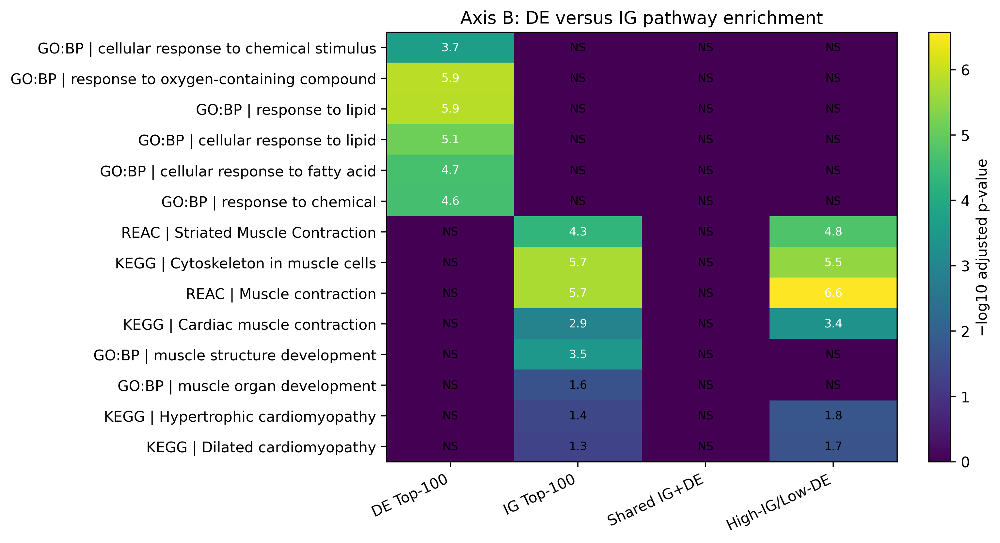

query,source,name,p_value,intersection_size
axis_b__de_top100,GO:BP,response to oxygen-containing compound,1.31e-06,34
axis_b__de_top100,GO:BP,response to lipid,1.34e-06,25
axis_b__de_top100,GO:BP,cellular response to lipid,7.43e-06,20
axis_b__de_top100,GO:BP,cellular response to fatty acid,2.23e-05,7
axis_b__de_top100,GO:BP,response to chemical,2.34e-05,47
axis_b__de_top100,KEGG,AGE-RAGE signaling pathway in diabetic complications,0.0351,5
axis_b__high_ig_low_de,KEGG,Cytoskeleton in muscle cells,3.09e-06,11
axis_b__high_ig_low_de,KEGG,Cardiac muscle contraction,0.000435,6
axis_b__high_ig_low_de,KEGG,Hypertrophic cardiomyopathy,0.0173,5
axis_b__high_ig_low_de,KEGG,Dilated cardiomyopathy,0.0209,5


In [27]:
display(Image(filename=str(C / 'axis_b_de_ig_enrichment.png')))
b_top=de_ig_pathways[de_ig_pathways['query'].str.startswith('axis_b')].groupby(['query','source'],group_keys=False).head(5)
display(b_top[['query','source','name','p_value','intersection_size']].style.format({'p_value':'{:.3g}'}).hide(axis='index'))

### Focused interpretation

**Shared biology.** Both rankings identify muscle-related biology, but their literal Top-100 intersections are small: 9 genes for Axis A and 8 for Axis B. The Axis A intersection alone significantly enriches *cytoskeleton in muscle cells*; the smaller Axis B intersection has no corrected term.

**DE-emphasized biology.** Axis A DE has a broader profile: circulatory/vascular and tissue development, immune/cytokine signaling, and regulation of metabolic processes. Axis B DE emphasizes responses to oxygen-containing compounds, lipids and fatty acids, plus vascular development. Conventional DE therefore exposes inflammatory and metabolic/lipid-response biology less apparent in IG. No explicit stress term passed correction in these fixed sets.

**IG-emphasized biology.** IG concentrates on muscle contraction, striated-muscle contraction, muscle cytoskeleton, and cardiomyopathy-associated structural collections. This remains true after removing every IG gene in the DE Top-500: Axis A retains six corrected muscle terms and Axis B retains six. The high-IG/low-DE sets are therefore coherent rather than an unstructured residual.

**Conclusion.** The best-supported category is **(c): additional coherent biology not obvious from the top DE genes**. The views share a muscle-response foundation, but DE gives more weight to large vascular, immune, metabolic and lipid responses, while IG preferentially ranks a coordinated muscle structural/contractile program whose individual genes often have modest marginal DE.

## 13. Species-specific IG pathway convergence

For each fixed axis, human and mouse studies are aggregated separately by averaging signed IG attribution changes and ranking genes by the magnitude of that species-specific mean. Only the Top-100 genes enter enrichment; no per-study enrichment is performed. GO Biological Process, KEGG, and Reactome use g:SCS correction and BridgeRNA's exact **15,165-gene custom background**.

In [28]:
S = R / 'latent_axis_attribution' / 'species_specific_enrichment'
species_ig_comparison = pd.read_csv(S / 'human_mouse_enrichment_comparison.csv')
species_ig_terms = pd.read_csv(S / 'significant_pathway_overlap.csv')
species_ig_enrichment = pd.read_parquet(S / 'species_specific_enrichment.parquet')
display(species_ig_comparison.style.format({c:'{:.3f}' for c in species_ig_comparison.columns if 'jaccard' in c}).hide(axis='index'))

axis,human_top100,mouse_top100,shared_top100_genes,gene_jaccard,GO:BP_human_terms,GO:BP_mouse_terms,GO:BP_shared_terms,GO:BP_human_only,GO:BP_mouse_only,GO:BP_jaccard,KEGG_human_terms,KEGG_mouse_terms,KEGG_shared_terms,KEGG_human_only,KEGG_mouse_only,KEGG_jaccard,REAC_human_terms,REAC_mouse_terms,REAC_shared_terms,REAC_human_only,REAC_mouse_only,REAC_jaccard
Axis A,100,100,31,0.183,1,2,0,1,2,0.000,1,4,1,0,3,0.250,2,3,2,0,1,0.667
Axis B,100,100,27,0.156,2,1,0,2,1,0.000,1,6,1,0,5,0.167,2,6,2,0,4,0.333


### Axis A: human versus mouse

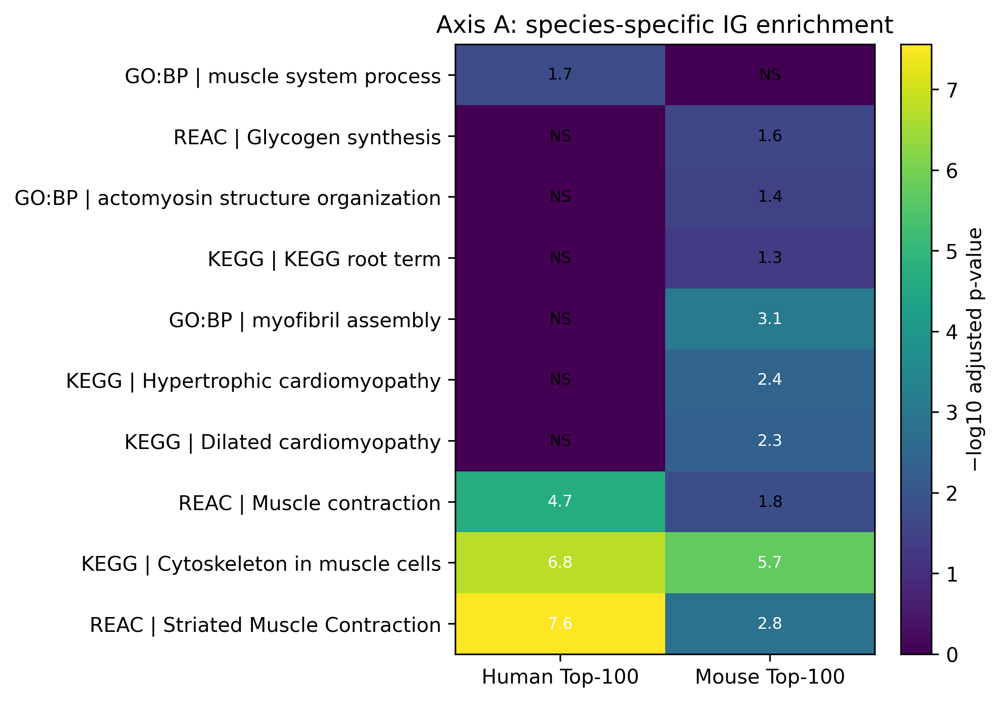

axis,source,native,name,human_significant,mouse_significant
Axis A,GO:BP,GO:0003012,muscle system process,True,False
Axis A,GO:BP,GO:0030239,myofibril assembly,False,True
Axis A,GO:BP,GO:0031032,actomyosin structure organization,False,True
Axis A,KEGG,KEGG:00000,KEGG root term,False,True
Axis A,KEGG,KEGG:04820,Cytoskeleton in muscle cells,True,True
Axis A,KEGG,KEGG:05410,Hypertrophic cardiomyopathy,False,True
Axis A,KEGG,KEGG:05414,Dilated cardiomyopathy,False,True
Axis A,REAC,REAC:R-HSA-3322077,Glycogen synthesis,False,True
Axis A,REAC,REAC:R-HSA-390522,Striated Muscle Contraction,True,True
Axis A,REAC,REAC:R-HSA-397014,Muscle contraction,True,True


In [29]:
display(Image(filename=str(S / 'axis_a_human_mouse_enrichment.png')))
display(species_ig_terms.query("axis == 'Axis A'").style.hide(axis='index'))

### Axis B: human versus mouse

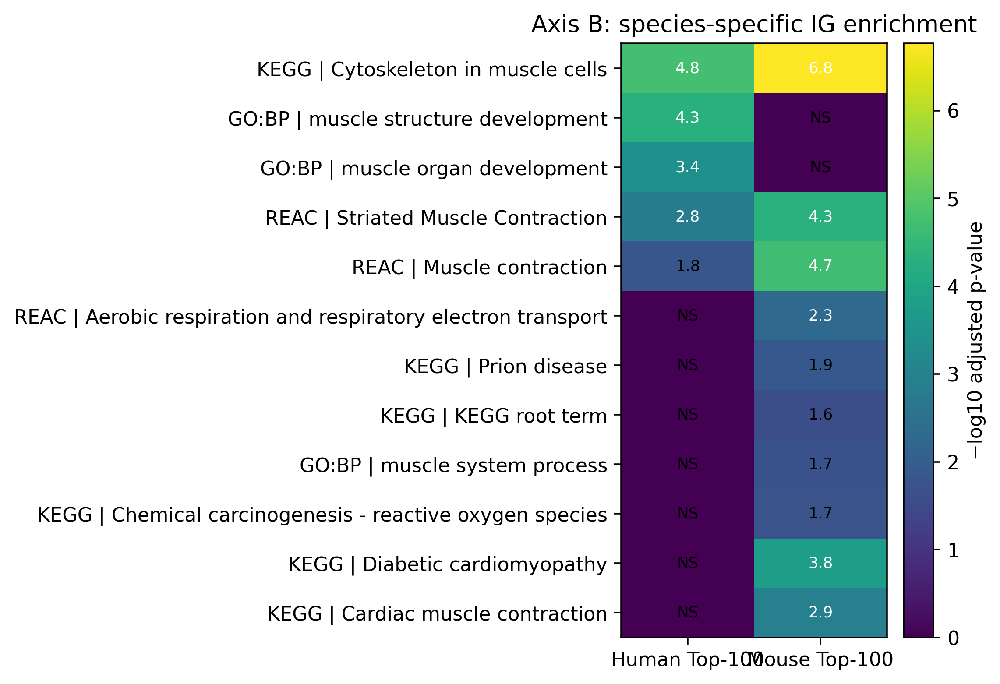

axis,source,native,name,human_significant,mouse_significant
Axis B,GO:BP,GO:0003012,muscle system process,False,True
Axis B,GO:BP,GO:0007517,muscle organ development,True,False
Axis B,GO:BP,GO:0061061,muscle structure development,True,False
Axis B,KEGG,KEGG:00000,KEGG root term,False,True
Axis B,KEGG,KEGG:04260,Cardiac muscle contraction,False,True
Axis B,KEGG,KEGG:04820,Cytoskeleton in muscle cells,True,True
Axis B,KEGG,KEGG:05020,Prion disease,False,True
Axis B,KEGG,KEGG:05208,Chemical carcinogenesis - reactive oxygen species,False,True
Axis B,KEGG,KEGG:05415,Diabetic cardiomyopathy,False,True
Axis B,REAC,REAC:R-HSA-1428517,Aerobic respiration and respiratory electron transport,False,True


In [30]:
display(Image(filename=str(S / 'axis_b_human_mouse_enrichment.png')))
display(species_ig_terms.query("axis == 'Axis B'").style.hide(axis='index'))

### Interpretation

Human and mouse prioritize substantially different individual genes while converging on the same broad biology. Their Top-100 overlaps are 31 genes for Axis A (Jaccard 0.183) and 27 for Axis B (Jaccard 0.156). Exact significant-term overlap is incomplete because related ontology terms occur at different levels, but both species independently recover muscle cytoskeleton and Reactome muscle/striated-muscle contraction in both axes.

Axis A mouse additionally resolves myofibril assembly, actomyosin organization, cardiomyopathy collections, and glycogen synthesis, whereas human uses the broader *muscle system process* term. Axis B human emphasizes muscle structure/organ development; mouse emphasizes muscle-system process and additionally returns respiratory electron transport/Complex I, reactive-oxygen, cardiac contraction, and complement terms. These mouse-specific findings are corrected results but should remain exploratory because each species consensus is based on few studies.

The main answer is therefore **yes**: despite modest gene-level overlap, human and mouse IG rankings independently converge on muscle contraction, structure, and cytoskeletal programs. Species-specific terms suggest differences in emphasis rather than evidence for unrelated response biology.

## 14. Final Pattern A/B biological synthesis

These final panels harmonize redundant significant GO Biological Process, KEGG, and Reactome terms into a fixed set of interpretable themes. Blank cells mean that no term assigned to that theme passed corrected significance. The full-transcriptome DE enrichment uses all edgeR-tested, unambiguously human-mappable genes in the constituent pattern studies as its custom background (16,076 genes for Pattern A; 17,029 for Pattern B). Every IG analysis uses BridgeRNA's exact 15,165-gene universe. The identical theme rows and order allow direct comparison without implying that A and B are biologically renamed classes.

In [31]:
Y = R / 'final_synthesis'
synthesis_matrix = pd.read_csv(Y / 'harmonized_theme_matrix.csv')
display(synthesis_matrix.style.format({c:'{:.2f}' for c in synthesis_matrix.columns if c not in ['pattern','theme']}, na_rep='').hide(axis='index'))

pattern,theme,Full-transcriptome DE,Human IG,Mouse IG,Conserved human–mouse IG
Pattern A,Muscle contraction,,7.56,2.84,3.56
Pattern A,Muscle structure / cytoskeleton,6.31,6.76,5.74,2.29
Pattern A,Cardiac contraction / cardiomyopathy,,,2.43,
Pattern A,Vascular / circulatory development,8.59,,,
Pattern A,Immune / cytokine signaling,4.71,,,
Pattern A,Lipid / fatty-acid response,1.44,,,
Pattern A,Oxidative / mitochondrial respiration,,,,
Pattern A,Glycogen / carbohydrate metabolism,,,1.62,
Pattern A,Metabolic regulation,6.90,,,
Pattern A,Oxygen / cellular stress response,,,,


### Pattern A

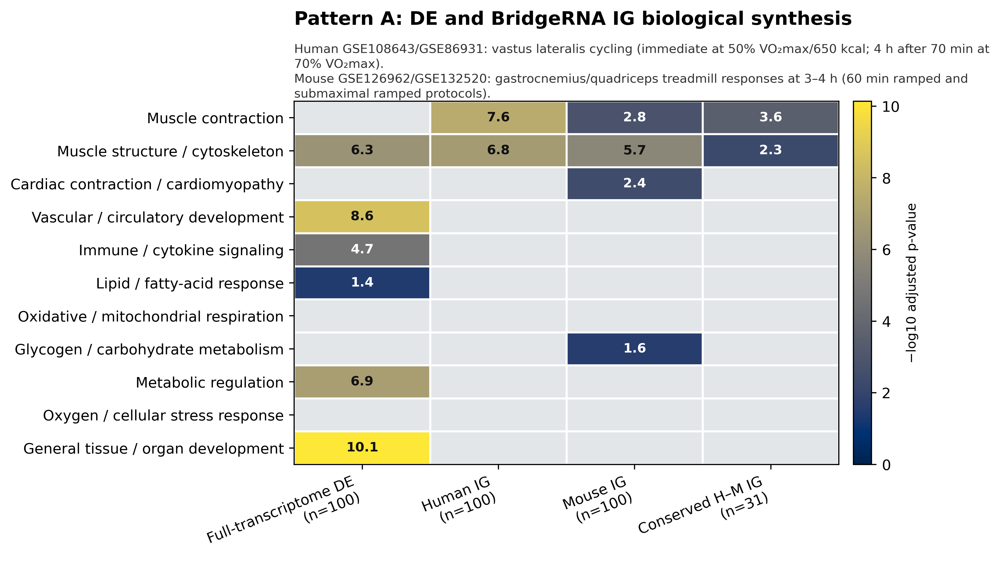

In [32]:
display(Image(filename=str(Y / 'pattern_a_synthesis_heatmap.png')))

### Pattern B

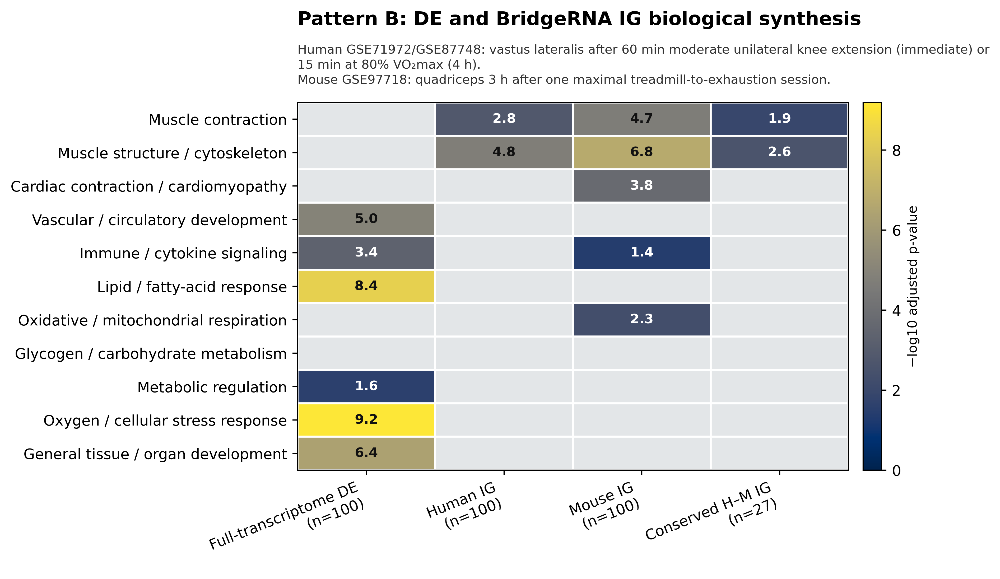

In [33]:
display(Image(filename=str(Y / 'pattern_b_synthesis_heatmap.png')))

### Synthesis

Across both patterns and across overall, human-specific, mouse-specific, and conserved IG sets, BridgeRNA consistently emphasizes muscle contraction and muscle structure/cytoskeleton. Conventional full-transcriptome DE provides complementary biology: Pattern A emphasizes vascular/circulatory and general tissue development, immune/cytokine signaling, and metabolic regulation; Pattern B emphasizes oxygen/cellular-stress and lipid/fatty-acid responses plus vascular development. Mouse IG adds glycogen biology in Pattern A and oxidative/mitochondrial respiration in Pattern B.

The synthesis therefore supports convergence of BridgeRNA attribution across species around coordinated muscle machinery, while full-transcriptome DE captures large marginal systemic and metabolic responses—including genes unavailable to BridgeRNA. These are complementary views rather than evidence that either representation exhaustively describes the response.

### Actual GO BP, KEGG, and Reactome terms

The harmonized panels above are the primary synthesis. These companion panels retain the original database and significant term names. To keep them readable, rows are the union of the three strongest corrected terms from each database for each analysis column; gray cells are nonsignificant.

#### Pattern A — detailed terms

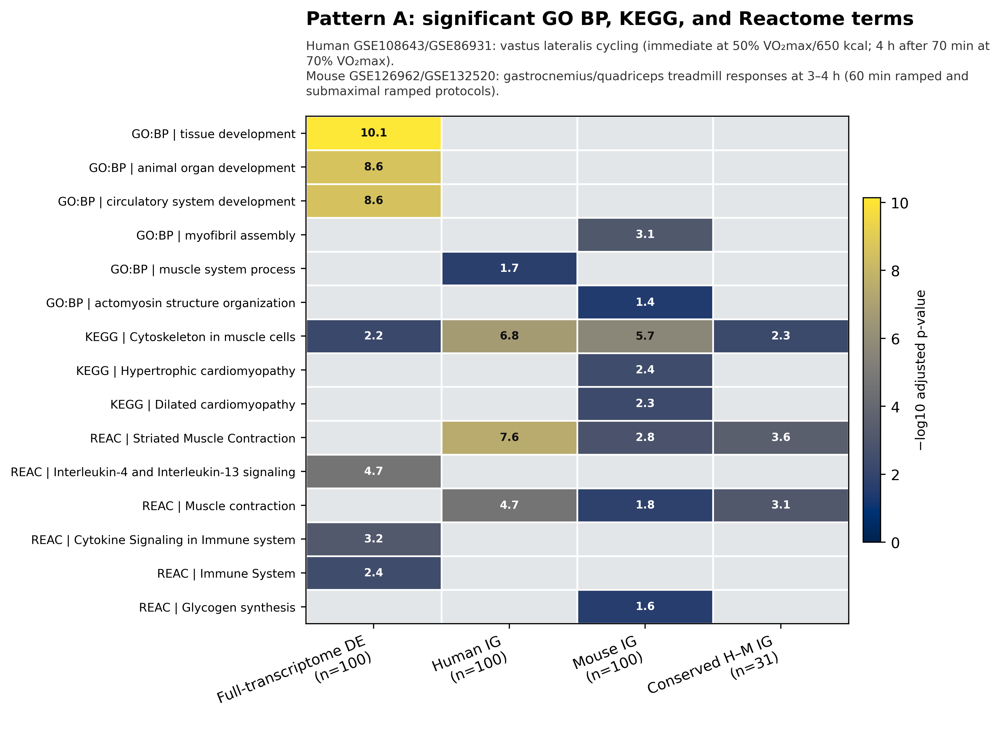

In [34]:
display(Image(filename=str(Y / 'pattern_a_detailed_terms_heatmap.png')))

#### Pattern B — detailed terms

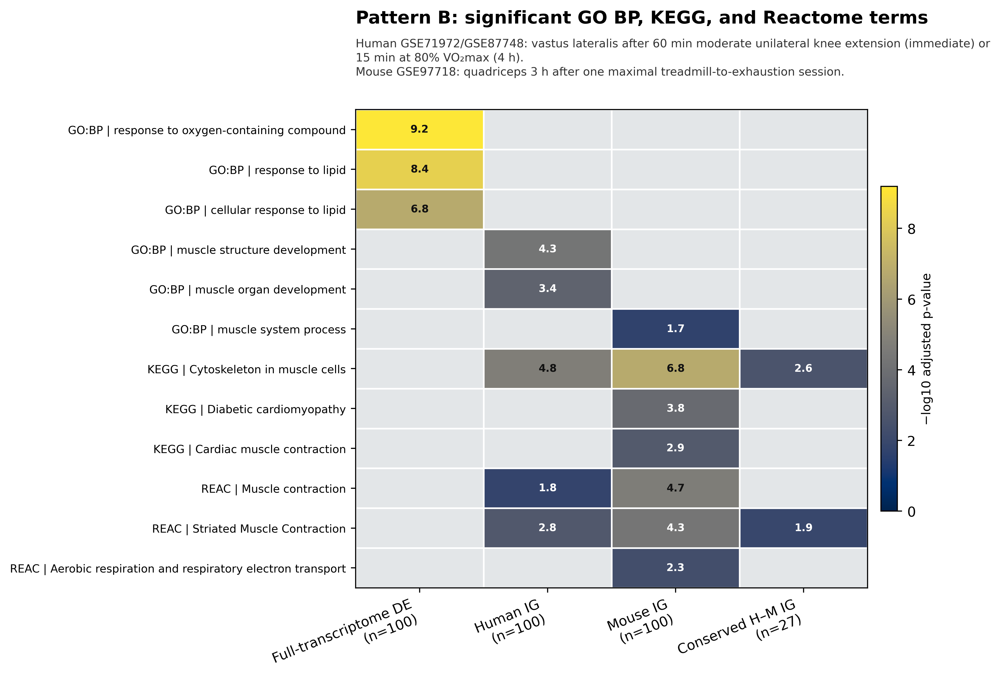

In [35]:
display(Image(filename=str(Y / 'pattern_b_detailed_terms_heatmap.png')))

In [36]:
detailed_terms = pd.read_csv(Y / 'detailed_term_matrix.csv')
display(detailed_terms.style.format({c:'{:.2f}' for c in detailed_terms.columns if c not in ['pattern','source','term']}, na_rep='').hide(axis='index'))

pattern,source,term,Full-transcriptome DE,Human IG,Mouse IG,Conserved human–mouse IG
Pattern A,GO:BP,GO:BP | tissue development,10.14,,,
Pattern A,GO:BP,GO:BP | animal organ development,8.62,,,
Pattern A,GO:BP,GO:BP | circulatory system development,8.59,,,
Pattern A,GO:BP,GO:BP | myofibril assembly,,,3.11,
Pattern A,GO:BP,GO:BP | muscle system process,,1.72,,
Pattern A,GO:BP,GO:BP | actomyosin structure organization,,,1.45,
Pattern A,KEGG,KEGG | Cytoskeleton in muscle cells,2.24,6.76,5.74,2.29
Pattern A,KEGG,KEGG | Hypertrophic cardiomyopathy,,,2.43,
Pattern A,KEGG,KEGG | Dilated cardiomyopathy,,,2.33,
Pattern A,REAC,REAC | Striated Muscle Contraction,,7.56,2.84,3.56


## 15. Pattern A/B metadata and technical-confound audit

This descriptive audit uses the exact eight contrast GSMs and curated GEPREP metadata. Studies are ordered A → intermediate → B. Missing metadata are shown rather than inferred, and no statistical tests are attempted with eight studies.

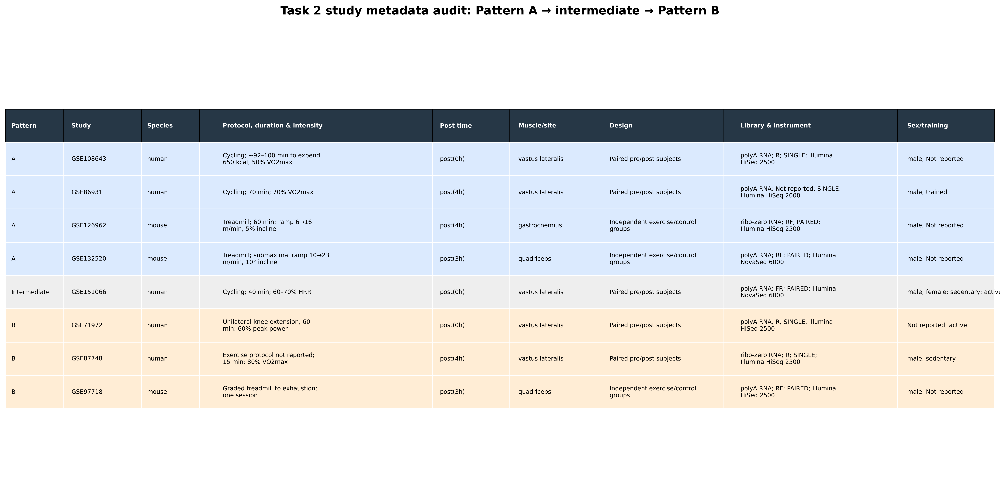

/tmp/ipykernel_72839/1879642278.py:5: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  display(metadata_flags.style.applymap(lambda x: 'background-color:#fce8e6' if 'Strong' in str(x) else ('background-color:#fff4ce' if 'Possible' in str(x) else ''), subset=['assessment']).hide(axis='index'))


variable,assessment,evidence
species,Does not track,Both A and B contain human and mouse studies.
exercise modality,Does not track,All selected contrasts are aerobic exercise.
protocol,Strong partial tracking,Both A human studies are cycling; B human studies use knee extension or an incompletely reported baseline protocol. Mouse studies are treadmill in both patterns.
duration/intensity,Possible biological confounding,"Protocols differ by study; B includes 80% VO2max and maximal exhaustion, but moderate exercise also occurs in B and intensive exercise in A."
post-exercise time,Does not track,Both patterns contain immediate and 3–4 h sampling.
muscle/site,Does not track,Vastus lateralis and quadriceps occur across patterns; gastrocnemius occurs only in one A study.
paired vs control design,Does not independently track,Human studies are paired and mouse studies use independent groups in both patterns; this is confounded with species.
sequencing instrument,Strong partial tracking,"All B studies use Illumina HiSeq 2500; A is heterogeneous (HiSeq 2500, HiSeq 2000, NovaSeq 6000). HiSeq 2500 is not exclusive to B."
library preparation/molecule,Does not track,PolyA and ribo-zero occur across patterns; preparation and layout largely follow study/species.
sex,Does not track / limited,Reported studies are predominantly male; sex is missing for GSE71972.


In [37]:
M = R / 'pattern_metadata_audit'
metadata_audit = pd.read_csv(M / 'study_metadata_audit.csv')
metadata_flags = pd.read_csv(M / 'pattern_tracking_flags.csv')
display(Image(filename=str(M / 'study_metadata_audit.png')))
display(metadata_flags.style.applymap(lambda x: 'background-color:#fce8e6' if 'Strong' in str(x) else ('background-color:#fff4ce' if 'Possible' in str(x) else ''), subset=['assessment']).hide(axis='index'))

### Audit conclusion

No measured variable perfectly separates Pattern A from Pattern B. Two variables deserve caution: both A human studies are cycling whereas the B human studies are knee-extension or incompletely reported exercise protocols, and all B studies used Illumina HiSeq 2500 whereas A spans HiSeq 2500, HiSeq 2000, and NovaSeq 6000. Neither feature is exclusive across the full cohort, so each is a strong partial—not perfect—tracker.

Intensity/duration and training status are possible biological confounders, but they are heterogeneous or incompletely reported. Species, post-exercise time, muscle/site, paired-versus-control design, library molecule/preparation, and sex do not independently track the split. Because protocol, study, and platform remain entangled at n=8, the latent A/B organization cannot be attributed exclusively to biology or dismissed as purely technical from this audit.

## 16. Extended latent-axis deletion sweep

Using the frozen model and existing rankings, this experiment masks 25–1,000 genes selected by axis-consensus IG, axis-consensus edgeR DE restricted to the 15,165 model genes, or five deterministic random panels per size. The outcome is each study's post-minus-pre latent-axis projection after deletion divided by its original projection. IG itself was not recomputed, and the compatible IG-ranked 25/50/100 results were reused.

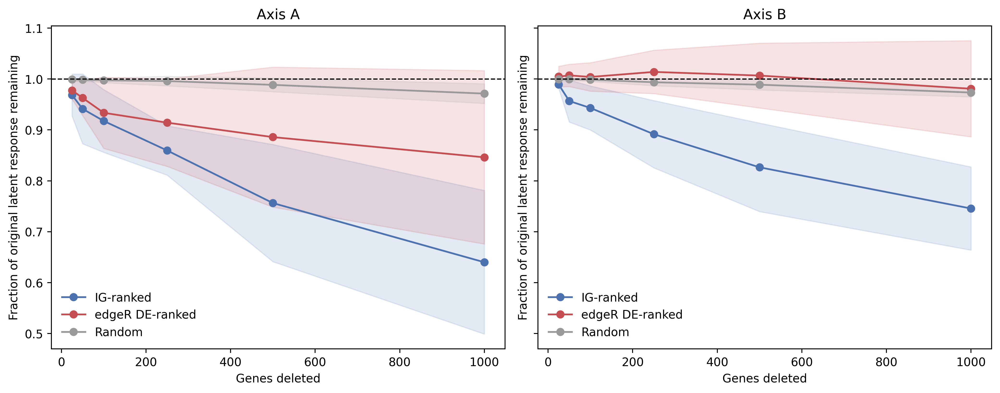

axis,genes_masked,panel_type,fraction_remaining_mean,fraction_remaining_sd,studies,replicates
Axis A,25,de_ranked,0.978,0.017,4,1
Axis A,25,ig_ranked,0.968,0.041,4,1
Axis A,25,random,0.999,0.002,4,5
Axis A,50,de_ranked,0.963,0.035,4,1
Axis A,50,ig_ranked,0.941,0.068,4,1
Axis A,50,random,0.998,0.003,4,5
Axis A,100,de_ranked,0.934,0.070,4,1
Axis A,100,ig_ranked,0.918,0.062,4,1
Axis A,100,random,0.997,0.004,4,5
Axis A,250,de_ranked,0.914,0.086,4,1


In [38]:
L = R / 'latent_axis_attribution'
deletion_summary = pd.read_csv(L / 'extended_deletion_sweep_summary.csv')
display(Image(filename=str(L / 'figures/extended_deletion_sweep.png')))
display(deletion_summary[['axis','genes_masked','panel_type','fraction_remaining_mean','fraction_remaining_sd','studies','replicates']].style.format({'fraction_remaining_mean':'{:.3f}','fraction_remaining_sd':'{:.3f}'}).hide(axis='index'))

### Interpretation

IG-ranked deletion weakens the targeted latent response much more than size-matched random deletion in both axes, with a monotonic dose response. At 1,000 genes, Axis A retains 0.640 of its original signal after IG deletion versus 0.971 after random deletion; Axis B retains 0.746 versus 0.973. edgeR-ranked deletion is intermediate for Axis A (0.846 at 1,000) but has little effect on Axis B (0.981). This functionally supports the earlier rank/enrichment result: BridgeRNA's axis signal is concentrated in its attributed genes and is not reproduced simply by deleting the largest conventional DE genes. Values slightly above 1 indicate that deletion can remove opposing contributions and increase the signed projection; they are not treated as improved biological response.